In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

import os

# hide warnings
import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [2]:
# reading the dataset
teleraw = pd.read_csv("telecom_churn_data.csv")
teleraw.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [3]:
#Converting to Lowercase only for Str type
teleraw = teleraw.applymap(lambda x: x.lower() if type(x) == str else x)

#Checking for Null values
teleraw.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   mobile_number             99999 non-null  int64  
 1   circle_id                 99999 non-null  int64  
 2   loc_og_t2o_mou            98981 non-null  float64
 3   std_og_t2o_mou            98981 non-null  float64
 4   loc_ic_t2o_mou            98981 non-null  float64
 5   last_date_of_month_6      99999 non-null  object 
 6   last_date_of_month_7      99398 non-null  object 
 7   last_date_of_month_8      98899 non-null  object 
 8   last_date_of_month_9      98340 non-null  object 
 9   arpu_6                    99999 non-null  float64
 10  arpu_7                    99999 non-null  float64
 11  arpu_8                    99999 non-null  float64
 12  arpu_9                    99999 non-null  float64
 13  onnet_mou_6               96062 non-null  float64
 14  onnet

# Cleaning Data

Dropping all Date related features as they will not be of much use for this Analysis

In [4]:
teleraw = teleraw.drop(["last_date_of_month_6", "last_date_of_month_7", "last_date_of_month_8", "last_date_of_month_9", "date_of_last_rech_6", "date_of_last_rech_7", "date_of_last_rech_8", "date_of_last_rech_9", "date_of_last_rech_data_6", "date_of_last_rech_data_7", "date_of_last_rech_data_8", "date_of_last_rech_data_9", "mobile_number"], axis=1)

def samevaluecolumns():
    column = []
    columns = teleraw.select_dtypes(include=['float64', 'int64'])
    for col in (columns):
        if(teleraw[col].value_counts().max() >= ((len(teleraw)*90)/100)):
            column.append(col)
    return column

columnsToBeRemoved = samevaluecolumns()

# Remove the columns with skewed data

teleraw.drop(columnsToBeRemoved, axis = 1, inplace = True)


In [5]:
#Checking the shape
teleraw.shape

(99999, 182)

In [6]:
#Checking the percentage of Missing data
(teleraw.isnull().sum() * 100 / len(teleraw)).sort_values(ascending=False)

max_rech_data_6       74.846748
fb_user_6             74.846748
av_rech_amt_data_6    74.846748
count_rech_3g_6       74.846748
count_rech_2g_6       74.846748
arpu_3g_6             74.846748
night_pck_user_6      74.846748
arpu_2g_6             74.846748
total_rech_data_6     74.846748
total_rech_data_7     74.428744
fb_user_7             74.428744
max_rech_data_7       74.428744
arpu_3g_7             74.428744
count_rech_3g_7       74.428744
arpu_2g_7             74.428744
night_pck_user_7      74.428744
av_rech_amt_data_7    74.428744
count_rech_2g_7       74.428744
arpu_2g_9             74.077741
arpu_3g_9             74.077741
av_rech_amt_data_9    74.077741
night_pck_user_9      74.077741
count_rech_3g_9       74.077741
total_rech_data_9     74.077741
count_rech_2g_9       74.077741
max_rech_data_9       74.077741
fb_user_9             74.077741
av_rech_amt_data_8    73.660737
count_rech_2g_8       73.660737
fb_user_8             73.660737
max_rech_data_8       73.660737
total_re

Most of the Values (Present and Missing) for Data related Recharge, 2G and 3G ARPU, Count of Data Recharge, last dates of Data recharge and Data Volume used show the same trend, from which we can assume that these features are related and the missing data is for Customers who are most probably are not using using Data Services. Hence we can impute the missing fields in these fetaures with '0'.

In [7]:
colsfill01 = ['max_rech_data_6', 'av_rech_amt_data_6', 'count_rech_3g_6', 'count_rech_2g_6', 'arpu_3g_6', 'arpu_2g_6', 'total_rech_data_6', 'total_rech_data_7', 'max_rech_data_7', 'arpu_3g_7', 'count_rech_3g_7', 'arpu_2g_7',  'av_rech_amt_data_7', 'count_rech_2g_7', 'arpu_2g_9', 'arpu_3g_9', 'av_rech_amt_data_9', 'count_rech_3g_9', 'total_rech_data_9', 'count_rech_2g_9', 'max_rech_data_9', 'av_rech_amt_data_8', 'count_rech_2g_8', 'max_rech_data_8', 'total_rech_data_8', 'arpu_3g_8', 'arpu_2g_8', 'count_rech_3g_8']

teleclean1 = teleraw
teleclean1[colsfill01] = teleclean1[colsfill01].fillna(0)

The Categorical Values are FB Users and Night Pack Users. In this we are could see that FB users Values are highly correlated to Data Volume used (2G or 3G). Hence we have taken a simple condition that if Volume used is atleast 5 MB or more (2G and 3G combined) that customer could have value "1" (True) for FB Users else it will be Value "0" (False).

In [8]:
#Imputing "0" for FB users for 6 month were data consumption has been less than 5 MB
condition = ((teleclean1['vol_2g_mb_6']+teleclean1['vol_3g_mb_6']) <= 5) & teleclean1['fb_user_6'].isna()
teleclean1.loc[condition, 'fb_user_6'] = 0

#Imputing "0" for FB users for 7 month were data consumption has been less than 5 MB
condition = ((teleclean1['vol_2g_mb_7']+teleclean1['vol_3g_mb_7']) <= 5) & teleclean1['fb_user_7'].isna()
teleclean1.loc[condition, 'fb_user_7'] = 0

#Imputing "0" for FB users for 8 month were data consumption has been less than 5 MB
condition = ((teleclean1['vol_2g_mb_8']+teleclean1['vol_3g_mb_8']) <= 5) & teleclean1['fb_user_8'].isna()
teleclean1.loc[condition, 'fb_user_8'] = 0

#Imputing "0" for FB users for 9 month were data consumption has been less than 5 MB
condition = ((teleclean1['vol_2g_mb_9']+teleclean1['vol_3g_mb_9']) <= 5) & teleclean1['fb_user_9'].isna()
teleclean1.loc[condition, 'fb_user_9'] = 0

#Imputing "1" for FB users for rest of the NaN cells, as they would be having more data consumption tha  5 MB
colsfill02 = ['fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9']
teleclean1[colsfill02] = teleclean1[colsfill02].fillna(1)



In [9]:
#Dropping Columns which are missing more than 70 % of the Values
teleclean1 = teleclean1.loc[:, teleclean1.isna().mean() < .7]

In [10]:
#Missing Value Columns

misscols = teleclean1.columns[teleclean1.isna().any()].tolist()

misscolsdf = teleclean1[misscols]

#Describe all the columns with Missing Values

misscolsdf.describe(include='all')

,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9
count,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000
mean,132.395875,133.670805,133.018098,130.302327,197.935577,197.045133,196.574803,190.337222,9.950013,7.149898,7.292981,6.343841,13.911337,9.818732,9.971890,8.555519,47.100763,46.473010,45.887806,44.584446,93.342088,91.397131,91.755128,90.463192,3.751013,3.792985,3.677991,3.655123,1.123056,1.368500,1.433821,1.232726,144.201175,141.670476,141.328209,138.709970,79.829870,83.299598,83.282673,82.342919,87.299624,90.804137,89.838390,86.276622,1.129011,1.115010,1.067792,1.042362,168.261218,175.221436,174.191498,169.664466,0.723892,3.916811,4.978279,5.053769,4.412767,0.454157,47.922365,47.990520,47.211362,46.281794,107.475650,107.120493,108.460515,106.155471,12.084305,12.599697,11.751834,12.173105,167.491059,167.719540,167.432575,164.619293,9.575993,10.011904,9.883921,9.432479,20.722240,21.656415,21.183211,19.620913,2.156397,2.216923,2.085004,2.173419,32.457179,33.887833,33.154735,31.229344,0.061557,0.033585,0.040361,0.163137,7.460608,8.334936,8.442001,8.063003,0.854656,1.012960,0.970800,1.017162
std,297.207406,308.794148,308.951589,308.477668,316.851613,325.862803,327.170662,319.396092,72.825411,73.447948,68.402466,57.1375

As checked above, we could see in most of the columns the value of Mean is far higher than Median, also Max values are gigher which points towards outliers in the Columns. Hence we are imputing these missing values with Median rather than Mean.

In [11]:
# For rest of the numerical type data which have missing values from the ranges of 3% to 7% we are imputing the missing values with Median of each feature.
teleclean1 = teleclean1.apply(lambda x: x.fillna(x.median()),axis=0)

In [12]:
#Checking if all the missing values have been dealt with
(teleclean1.isna().sum() * 100 / len(teleclean1)).sort_values(ascending=False)

jun_vbc_3g            0.0
std_og_t2m_mou_6      0.0
total_og_mou_8        0.0
total_og_mou_7        0.0
total_og_mou_6        0.0
og_others_6           0.0
spl_og_mou_9          0.0
spl_og_mou_8          0.0
spl_og_mou_7          0.0
spl_og_mou_6          0.0
isd_og_mou_9          0.0
std_og_mou_9          0.0
std_og_mou_8          0.0
std_og_mou_7          0.0
std_og_mou_6          0.0
std_og_t2f_mou_9      0.0
std_og_t2f_mou_8      0.0
std_og_t2f_mou_7      0.0
std_og_t2f_mou_6      0.0
std_og_t2m_mou_9      0.0
std_og_t2m_mou_8      0.0
total_og_mou_9        0.0
loc_ic_t2t_mou_6      0.0
loc_ic_t2t_mou_7      0.0
loc_ic_mou_6          0.0
std_ic_t2m_mou_6      0.0
std_ic_t2t_mou_9      0.0
std_ic_t2t_mou_8      0.0
std_ic_t2t_mou_7      0.0
std_ic_t2t_mou_6      0.0
loc_ic_mou_9          0.0
loc_ic_mou_8          0.0
loc_ic_mou_7          0.0
loc_ic_t2f_mou_9      0.0
loc_ic_t2t_mou_8      0.0
loc_ic_t2f_mou_8      0.0
loc_ic_t2f_mou_7      0.0
loc_ic_t2f_mou_6      0.0
loc_ic_t2m_m

# Filtering High Value Customers

In [13]:
#Cretaing a new feature for the Total Recharge amout of Good Phase (Sum of 6 and 7 month)
teleclean1['total_rech_goodphase'] = teleclean1['total_rech_amt_6'] + teleclean1['total_rech_amt_7'] + teleclean1['total_rech_data_6'] + teleclean1['total_rech_data_7']

In [14]:
#Creating new Dataframe which has high value customers i.e. Observations above 70 Percentile of Total recharge for good Phase
telehv1 = teleclean1[teleclean1['total_rech_goodphase'] > teleclean1['total_rech_goodphase'].quantile(0.7)]


In [15]:
#Resetting Index
telehv1 = telehv1.reset_index(drop=True)

In [16]:
#Checking shape of New Dataframe for High Value Customers
telehv1.shape

(29991, 179)

In [17]:
telehv1.head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_rech_goodphase
0,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,29.84,453.43,567.16,325.91,87.29,16.23,33.49,31.64,0.00,23.74,12.59,38.06,0.00,51.39,31.38,40.28,11.26,308.63,447.38,162.28,39.12,62.13,55.14,53.23,0.00,0.0,0.0,0.00,0.0,422.16,533.91,255.79,61.84,4.30,23.29,12.01,0.00,49.89,31.76,49.14,2.50,6.66,20.08,16.68,0.00,60.86,75.14,77.84,8.41,0.0,4.50,0.00,6.50,0.00,0.00,487.53,609.24,350.16,0.00,58.14,32.26,27.31,15.66,217.56,221.49,121.19,56.61,152.16,101.46,39.53,0.96,427.88,355.23,188.04,91.64,36.89,11.83,30.39,0.00,91.44,126.99,141.33,1.74,52.19,34.24,22.21,0.0,180.54,173.08,193.94,5.38,626.46,558.04,428.74,0.00,0.21,0.0,0.0,0.0,2.06,14.53,31.59,0.00,15.74,15.19,15.14,0.00,5,5,7,3,1580,790,3638,0,1580,790,1580,0,0,0,779,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.0,0.0,0.0,0.0,802,57.74,19.38,18.74,2370.0
1,378.721,492.223,137.362,166.787,413.69,351.03,35.08,33.46,94.66,80.63,136.48,108.71,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,26.13,80.96,70.58,50.54,34.58,0.00,0.00,0.00,0.00,0.0,0.0,7.15,0.0,378.09,288.18,63.04,60.71,116.56,133.43,22.58,7.33,13.69,10.04,75.69,74.13,0.00,0.00,0.00,0.00,130.26,143.48,98.28,81.46,0.0,0.00,0.00,10.23,0.00,0.00,508.36,431.66,171.56,142.18,23.84,9.84,0.31,4.03,57.58,13.98,15.48,17.34,0.00,0.00,0.

telehvclean.head()


In [18]:
teleclean1.head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_rech_goodphase
0,197.385,214.816,213.803,21.100,34.31,32.33,0.00,29.84,96.31,91.735,0.00,87.29,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,11.91,11.61,0.00,11.26,41.03,40.43,0.00,39.12,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,65.11,63.685,0.00,61.84,0.00,0.00,0.00,0.00,3.95,3.635,0.00,2.50,0.00,0.00,0.00,0.0,11.64,11.09,0.00,8.41,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,15.69,15.74,0.16,15.66,56.49,57.08,4.13,56.61,0.88,0.93,1.15,0.96,92.16,92.55,5.44,91.64,0.00,0.00,0.00,0.00,2.03,2.04,0.00,1.74,0.00,0.00,0.00,0.00,5.89,5.96,0.00,5.38,0.00,0.00,5.44,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,4,3,2,6,362,252,252,0,252,252,252,0,252,252,252,0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,0.00,212.17,212.17,212.17,0.0,0,0,0,0,1.0,1.0,1.0,0.0,968,30.4,0.0,101.20,616.0
1,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.840,304.76,53.76,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.00,0.00,0.00,0.00,0.0,2.91,0.00,0.00,35.39,150.510,299.54,72.11,0.23,4.11,0.00,0.00,0.00,0.460,0.13,0.00,0.00,0.00,0.00,0.0,0.23,4.58,0.13,0.00,0.0,4.68,23.43,12.76,0.00,0.00,40.31,178.53,312.44,72.11,1.61,29.91,29.23,116.09,17.48,65.38,375.58,56.93,0.00,8.93,3.61,0.00,19.09,104.23,408.43,173.03,0.00,0.00,2.35,0.00,5.90,0.

In [19]:
telehv1.describe(include="all")

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_rech_goodphase
count,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.00000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,29991.000000,2

# Step 3: Derive Churn Column

## Since there is no Target column we are deriving the columns based on the condition that the total usage( in the chunrn month (9th month) will be marked as Churned.

In [20]:
#calculating total usage in new column based on total_og_mou_9, total_ic_mou_9,vol_2g_mb_9,vol_3g_mb_9
telehv1['total_usage'] = telehv1['total_og_mou_9'] + telehv1['total_ic_mou_9']+telehv1['vol_2g_mb_9'] + telehv1['vol_3g_mb_9']
#telehv1['churn'] = teleclean1[teleclean1['total_rech_goodphase'] > teleclean1['total_rech_goodphase'].quantile(0.7)]
telehv1['churn'] = np.where(telehv1.total_usage == 0,1,0)

In [21]:
telehv1.head()

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_rech_goodphase,total_usage,churn
0,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,29.84,453.43,567.16,325.91,87.29,16.23,33.49,31.64,0.00,23.74,12.59,38.06,0.00,51.39,31.38,40.28,11.26,308.63,447.38,162.28,39.12,62.13,55.14,53.23,0.00,0.0,0.0,0.00,0.0,422.16,533.91,255.79,61.84,4.30,23.29,12.01,0.00,49.89,31.76,49.14,2.50,6.66,20.08,16.68,0.00,60.86,75.14,77.84,8.41,0.0,4.50,0.00,6.50,0.00,0.00,487.53,609.24,350.16,0.00,58.14,32.26,27.31,15.66,217.56,221.49,121.19,56.61,152.16,101.46,39.53,0.96,427.88,355.23,188.04,91.64,36.89,11.83,30.39,0.00,91.44,126.99,141.33,1.74,52.19,34.24,22.21,0.0,180.54,173.08,193.94,5.38,626.46,558.04,428.74,0.00,0.21,0.0,0.0,0.0,2.06,14.53,31.59,0.00,15.74,15.19,15.14,0.00,5,5,7,3,1580,790,3638,0,1580,790,1580,0,0,0,779,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0.0,0.0,0.0,0.0,802,57.74,19.38,18.74,2370.0,0.00,1
1,378.721,492.223,137.362,166.787,413.69,351.03,35.08,33.46,94.66,80.63,136.48,108.71,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,26.13,80.96,70.58,50.54,34.58,0.00,0.00,0.00,0.00,0.0,0.0,7.15,0.0,378.09,288.18,63.04,60.71,116.56,133.43,22.58,7.33,13.69,10.04,75.69,74.13,0.00,0.00,0.00,0.00,130.26,143.48,98.28,81.46,0.0,0.00,0.00,10.23,0.00,0.00,508.36,431.66,171.56,142.18,23.84,9.84,0.31,4.03,57.58,13.98

In [22]:
## Since the Churn variable is calculated we are dropping all the columns for the churn month
telehv1 = telehv1.loc[:, ~telehv1.columns.str.contains('_9')]
telehv1.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_rech_goodphase,total_usage,churn
0,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,4.50,0.00,6.50,0.00,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,0,0,779,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0,0,0,0.0,0.0,0.0,802,57.74,19.38,18.74,2370.0,0.00,1
1,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.00,0.00,10.23,0.00,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,50,0,10,0.0,2.0,3.0,0.0,154.0,23.0,0.0,2.0,3.0,0.0,0.0,0.0,0.0,177.0,69.0,0.0,356.0,0.03,0.0,750.95,11.94,0.0,0.0,19.83,0.0,0.0,0.0,0,1,3,0.0,1.0,1.0,315,21.03,910.65,122.16,1040.0,177.09,0
2,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,0.0,0.0,0.49,205.31,53.48,353.99,446.41,85.98,498.23,255.36,52.94,156.94,0.00,0.00,0.00,701.78,138.93,655.18,0.00,0.00,4.78,0.00,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.49,215.58,26.11,255.26,115.68,38.29,154.58,308.13,29.79,317.91,0.00,0.00,1.91,423.81,68.09,474.41,968.61,172.58,1144.53,0.45,0.0,0.0,245.28,62.11,393.39,83.48,16.24,21.44,6,4,11,507,253,717,110,110,130,110,50

In [23]:
telehv1.shape

(29991, 137)

Combining the Features of 6 and 7 months to form the good phase features

In [24]:
telehv1["arpu_good"] = (telehv1["arpu_6"] + telehv1["arpu_7"]) / 2
telehv1["onnet_mou_good"] = (telehv1["onnet_mou_6"] + telehv1["onnet_mou_7"]) / 2
telehv1["offnet_mou_good"] = (telehv1["offnet_mou_6"] + telehv1["offnet_mou_7"]) / 2
telehv1["roam_ic_mou_good"] = (telehv1["roam_ic_mou_6"] + telehv1["roam_ic_mou_7"]) / 2
telehv1["roam_og_mou_good"] = (telehv1["roam_og_mou_6"] + telehv1["roam_og_mou_7"]) / 2
telehv1["loc_og_t2t_mou_good"] = (telehv1["loc_og_t2t_mou_6"] + telehv1["loc_og_t2t_mou_7"]) / 2
telehv1["loc_og_t2m_mou_good"] = (telehv1["loc_og_t2m_mou_6"] + telehv1["loc_og_t2m_mou_7"]) / 2
telehv1["loc_og_t2f_mou_good"] = (telehv1["loc_og_t2f_mou_6"] + telehv1["loc_og_t2f_mou_7"]) / 2
telehv1["loc_og_t2c_mou_good"] = (telehv1["loc_og_t2c_mou_6"] + telehv1["loc_og_t2c_mou_7"]) / 2
telehv1["loc_og_mou_good"] = (telehv1["loc_og_mou_6"] + telehv1["loc_og_mou_7"]) / 2
telehv1["std_og_t2t_mou_good"] = (telehv1["std_og_t2t_mou_6"] + telehv1["std_og_t2t_mou_7"]) / 2
telehv1["std_og_t2m_mou_good"] = (telehv1["std_og_t2m_mou_6"] + telehv1["std_og_t2m_mou_7"]) / 2
telehv1["std_og_t2f_mou_good"] = (telehv1["std_og_t2f_mou_6"] + telehv1["std_og_t2f_mou_7"]) / 2
telehv1["std_og_mou_good"] = (telehv1["std_og_mou_6"] + telehv1["std_og_mou_7"]) / 2
telehv1["spl_og_mou_good"] = (telehv1["spl_og_mou_6"] + telehv1["spl_og_mou_7"]) / 2
telehv1["og_others_good"] = (telehv1["og_others_6"]) / 2
telehv1["total_og_mou_good"] = (telehv1["total_og_mou_6"] + telehv1["total_og_mou_7"]) / 2
telehv1["loc_ic_t2t_mou_good"] = (telehv1["loc_ic_t2t_mou_6"] + telehv1["loc_ic_t2t_mou_7"]) / 2
telehv1["loc_ic_t2m_mou_good"] = (telehv1["loc_ic_t2m_mou_6"] + telehv1["loc_ic_t2m_mou_7"]) / 2
telehv1["loc_ic_t2f_mou_good"] = (telehv1["loc_ic_t2f_mou_6"] + telehv1["loc_ic_t2f_mou_7"]) / 2
telehv1["loc_ic_mou_good"] = (telehv1["loc_ic_mou_6"] + telehv1["loc_ic_mou_7"]) / 2
telehv1["std_ic_t2t_mou_good"] = (telehv1["std_ic_t2t_mou_6"] + telehv1["std_ic_t2t_mou_7"]) / 2
telehv1["std_ic_t2m_mou_good"] = (telehv1["std_ic_t2m_mou_6"] + telehv1["std_ic_t2m_mou_7"]) / 2
telehv1["std_ic_t2f_mou_good"] = (telehv1["std_ic_t2f_mou_6"] + telehv1["std_ic_t2f_mou_7"]) / 2
telehv1["std_ic_mou_good"] = (telehv1["std_ic_mou_6"] + telehv1["std_ic_mou_7"]) / 2
telehv1["total_ic_mou_good"] = (telehv1["total_ic_mou_6"] + telehv1["total_ic_mou_7"]) / 2
telehv1["spl_ic_mou_good"] = (telehv1["spl_ic_mou_6"] + telehv1["spl_ic_mou_7"]) / 2
telehv1["isd_ic_mou_good"] = (telehv1["isd_ic_mou_6"] + telehv1["isd_ic_mou_7"]) / 2
telehv1["ic_others_good"] = (telehv1["ic_others_6"] + telehv1["ic_others_7"]) / 2
telehv1["total_rech_num_good"] = (telehv1["total_rech_num_6"] + telehv1["total_rech_num_7"]) / 2
telehv1["total_rech_amt_good"] = (telehv1["total_rech_amt_6"] + telehv1["total_rech_amt_7"]) / 2
telehv1["max_rech_amt_good"] = (telehv1["max_rech_amt_6"] + telehv1["max_rech_amt_7"]) / 2
telehv1["last_day_rch_amt_good"] = (telehv1["last_day_rch_amt_6"] + telehv1["last_day_rch_amt_7"]) / 2
telehv1["total_rech_data_good"] = (telehv1["total_rech_data_6"] + telehv1["total_rech_data_7"]) / 2
telehv1["max_rech_data_good"] = (telehv1["max_rech_data_6"] + telehv1["max_rech_data_7"]) / 2
telehv1["count_rech_2g_good"] = (telehv1["count_rech_2g_6"] + telehv1["count_rech_2g_7"]) / 2
telehv1["count_rech_3g_good"] = (telehv1["count_rech_3g_6"] + telehv1["count_rech_3g_7"]) / 2
telehv1["av_rech_amt_data_good"] = (telehv1["av_rech_amt_data_6"] + telehv1["av_rech_amt_data_7"]) / 2
telehv1["vol_2g_mb_good"] = (telehv1["vol_2g_mb_6"] + telehv1["vol_2g_mb_7"]) / 2
telehv1["vol_3g_mb_good"] = (telehv1["vol_3g_mb_6"] + telehv1["vol_3g_mb_7"]) / 2
telehv1["arpu_3g_good"] = (telehv1["arpu_3g_6"] + telehv1["arpu_3g_7"]) / 2
telehv1["arpu_2g_good"] = (telehv1["arpu_2g_6"] + telehv1["arpu_2g_7"]) / 2
telehv1["sachet_2g_good"] = (telehv1["sachet_2g_6"] + telehv1["sachet_2g_7"]) / 2
telehv1["fb_user_good"] = (telehv1["fb_user_6"] + telehv1["fb_user_7"]) / 2

In [25]:
#Dropping the features of 6 and 7 months as Good Phase Derived features have been created
telehv1 = telehv1.loc[:, ~telehv1.columns.str.contains('_6')]
telehv1 = telehv1.loc[:, ~telehv1.columns.str.contains('_7')]

In [26]:
telehv1.shape

(29991, 94)

In [27]:
telehv1.head()

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2t_mou_8,std_og_t2m_mou_8,std_og_t2f_mou_8,std_og_mou_8,spl_og_mou_8,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2m_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,total_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,total_rech_amt_8,max_rech_amt_8,last_day_rch_amt_8,total_rech_data_8,max_rech_data_8,count_rech_2g_8,count_rech_3g_8,av_rech_amt_data_8,vol_2g_mb_8,vol_3g_mb_8,arpu_3g_8,arpu_2g_8,sachet_2g_8,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_rech_goodphase,total_usage,churn,arpu_good,onnet_mou_good,offnet_mou_good,roam_ic_mou_good,roam_og_mou_good,loc_og_t2t_mou_good,loc_og_t2m_mou_good,loc_og_t2f_mou_good,loc_og_t2c_mou_good,loc_og_mou_good,std_og_t2t_mou_good,std_og_t2m_mou_good,std_og_t2f_mou_good,std_og_mou_good,spl_og_mou_good,og_others_good,total_og_mou_good,loc_ic_t2t_mou_good,loc_ic_t2m_mou_good,loc_ic_t2f_mou_good,loc_ic_mou_good,std_ic_t2t_mou_good,std_ic_t2m_mou_good,std_ic_t2f_mou_good,std_ic_mou_good,total_ic_mou_good,spl_ic_mou_good,isd_ic_mou_good,ic_others_good,total_rech_num_good,total_rech_amt_good,max_rech_amt_good,last_day_rch_amt_good,total_rech_data_good,max_rech_data_good,count_rech_2g_good,count_rech_3g_good,av_rech_amt_data_good,vol_2g_mb_good,vol_3g_mb_good,arpu_3g_good,arpu_2g_good,sachet_2g_good,fb_user_good
0,3171.480,52.29,325.91,31.64,38.06,40.28,162.28,53.23,0.00,255.79,12.01,49.14,16.68,77.84,6.50,350.16,27.31,121.19,39.53,188.04,30.39,141.33,22.21,193.94,428.74,0.0,31.59,15.14,7,3638,1580,779,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0,0.0,802,57.74,19.38,18.74,2370.0,0.00,1,1209.5150,56.260,510.295,24.860,18.165,41.385,378.005,58.635,0.0,478.035,13.795,40.825,13.37,68.000,2.25,0.000,548.385,45.200,219.525,126.810,391.555,24.360,109.215,43.215,176.810,592.250,0.105,8.295,15.465,5.0,1185.0,1185.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0
1,137.362,35.08,136.48,0.00,0.00,12.49,50.54,0.00,7.15,63.04,22.58,75.69,0.00,98.28,10.23,171.56,0.31,15.48,0.00,15.79,0.10,0.65,0.00,0.75,16.54,0.0,0.00,0.00,14,120,30,10,3.0,23.0,3.0,0.0,69.0,0.03,11.94,19.83,0.0,3,1.0,315,21.03,910.65,122.16,1040.0,177.09,0,435.4720,382.360,87.645,0.000,0.000,257.360,75.770,0.000,0.0,333.135,124.995,11.865,0.00,136.870,0.00,0.000,470.010,16.840,35.780,0.000,52.630,0.290,13.255,0.000,13.545,66.175,0.000,0.000,0.000,20.0,519.0,122.0,25.0,1.0,77.0,1.0,0.0,88.5,178.0,375.475,0.0,0.0,0.5,0.5
2,593.260,534.24,482.46,72.11,1.44,36.01,294.46,23.51,0.49,353.99,498.23,156.94,0.00,655.18,4.78,1015.26,52.58,195.18,7.49,255.26,154.58,317.91,1.91,474.41,1144.53,0.0,393.39,21.44,11,717,130,0,3.0,23.0,3.0,0.0,69.0,0.02,0.00,0.00,0.2,3,1.0,2607,0.00,0.00,0.00,760.0,1077.95,0,349.2585,305.075,266.295,83.885,21.620,27.910,99.205,2.270,0.0,129.395,266.195,154.150,0.00,420.355,0.00,0.000,549.750,37.730,80.705,2.405,120.845,76.985,168.960,0.000,245.950,570.595,0.225,153.695,49.860,5.0,380.0,110.0,80.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0
3,187.894,70.61,162.76,0.00,0.00,67.38,128.28,10.26,0.00,205.93,3.23,18.29,0.00,21.53,5.91,233.38,28.89,150.16,32.71,211.78,6.33,73.93,2.18,82.44,294.46,0.0,0.23,0.00,2,160,130,130,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0,0.0,511,0.00,2.45,21.89,918.0,590.30,0,365.4220,62.260,263.015,1.415,8.870,53.885,209.640,2.240,0.0,265.775,5.235,43.750,0.00,48.990,1.63,0.000,316.410,56.385,188.250,8.695,253.345,73.715,45.880,0.255,119.860,373.210,0.000,0.000,0.000,8.0,459.0,110.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0
4,25.499,7.79,5.54,4.81,13.34,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,4,30,30,0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0,0.0,667,0.00,0.00,0.00,816.0,718.21,0,354.4940,597.595,30.820,2.380,4.230,19.495,29.270,0.000,0.0,48.770,573.860,0.775,0.00,574.635,1.29,0.465,625.170,17.270,24.860,

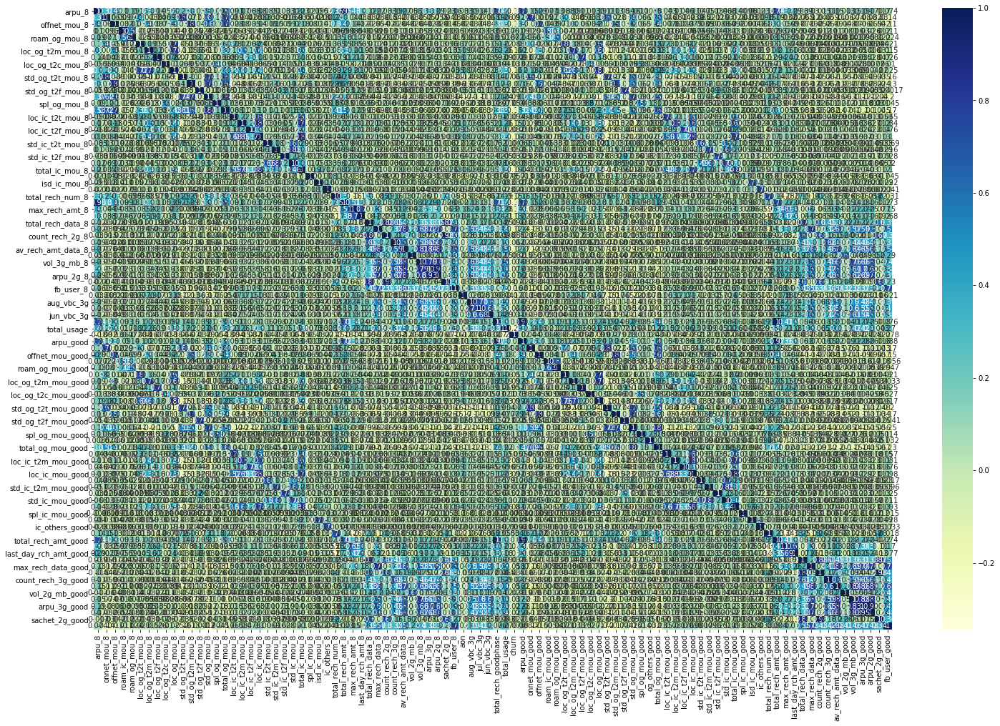

In [28]:
#Created Correlation Matrix for Numerical values
cor = telehv1.corr()
# heatmap
plt.figure(figsize=(25,16))
sns.heatmap(cor, cmap="YlGnBu", annot=True)
plt.show()

Train - Test Split

In [29]:
from sklearn.model_selection import train_test_split

In [30]:
# Putting feature variable to X
X = telehv1.drop(['churn'], axis=1)

X.head()

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,loc_og_mou_8,std_og_t2t_mou_8,std_og_t2m_mou_8,std_og_t2f_mou_8,std_og_mou_8,spl_og_mou_8,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2m_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,total_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,total_rech_amt_8,max_rech_amt_8,last_day_rch_amt_8,total_rech_data_8,max_rech_data_8,count_rech_2g_8,count_rech_3g_8,av_rech_amt_data_8,vol_2g_mb_8,vol_3g_mb_8,arpu_3g_8,arpu_2g_8,sachet_2g_8,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_rech_goodphase,total_usage,arpu_good,onnet_mou_good,offnet_mou_good,roam_ic_mou_good,roam_og_mou_good,loc_og_t2t_mou_good,loc_og_t2m_mou_good,loc_og_t2f_mou_good,loc_og_t2c_mou_good,loc_og_mou_good,std_og_t2t_mou_good,std_og_t2m_mou_good,std_og_t2f_mou_good,std_og_mou_good,spl_og_mou_good,og_others_good,total_og_mou_good,loc_ic_t2t_mou_good,loc_ic_t2m_mou_good,loc_ic_t2f_mou_good,loc_ic_mou_good,std_ic_t2t_mou_good,std_ic_t2m_mou_good,std_ic_t2f_mou_good,std_ic_mou_good,total_ic_mou_good,spl_ic_mou_good,isd_ic_mou_good,ic_others_good,total_rech_num_good,total_rech_amt_good,max_rech_amt_good,last_day_rch_amt_good,total_rech_data_good,max_rech_data_good,count_rech_2g_good,count_rech_3g_good,av_rech_amt_data_good,vol_2g_mb_good,vol_3g_mb_good,arpu_3g_good,arpu_2g_good,sachet_2g_good,fb_user_good
0,3171.480,52.29,325.91,31.64,38.06,40.28,162.28,53.23,0.00,255.79,12.01,49.14,16.68,77.84,6.50,350.16,27.31,121.19,39.53,188.04,30.39,141.33,22.21,193.94,428.74,0.0,31.59,15.14,7,3638,1580,779,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0,0.0,802,57.74,19.38,18.74,2370.0,0.00,1209.5150,56.260,510.295,24.860,18.165,41.385,378.005,58.635,0.0,478.035,13.795,40.825,13.37,68.000,2.25,0.000,548.385,45.200,219.525,126.810,391.555,24.360,109.215,43.215,176.810,592.250,0.105,8.295,15.465,5.0,1185.0,1185.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0
1,137.362,35.08,136.48,0.00,0.00,12.49,50.54,0.00,7.15,63.04,22.58,75.69,0.00,98.28,10.23,171.56,0.31,15.48,0.00,15.79,0.10,0.65,0.00,0.75,16.54,0.0,0.00,0.00,14,120,30,10,3.0,23.0,3.0,0.0,69.0,0.03,11.94,19.83,0.0,3,1.0,315,21.03,910.65,122.16,1040.0,177.09,435.4720,382.360,87.645,0.000,0.000,257.360,75.770,0.000,0.0,333.135,124.995,11.865,0.00,136.870,0.00,0.000,470.010,16.840,35.780,0.000,52.630,0.290,13.255,0.000,13.545,66.175,0.000,0.000,0.000,20.0,519.0,122.0,25.0,1.0,77.0,1.0,0.0,88.5,178.0,375.475,0.0,0.0,0.5,0.5
2,593.260,534.24,482.46,72.11,1.44,36.01,294.46,23.51,0.49,353.99,498.23,156.94,0.00,655.18,4.78,1015.26,52.58,195.18,7.49,255.26,154.58,317.91,1.91,474.41,1144.53,0.0,393.39,21.44,11,717,130,0,3.0,23.0,3.0,0.0,69.0,0.02,0.00,0.00,0.2,3,1.0,2607,0.00,0.00,0.00,760.0,1077.95,349.2585,305.075,266.295,83.885,21.620,27.910,99.205,2.270,0.0,129.395,266.195,154.150,0.00,420.355,0.00,0.000,549.750,37.730,80.705,2.405,120.845,76.985,168.960,0.000,245.950,570.595,0.225,153.695,49.860,5.0,380.0,110.0,80.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0
3,187.894,70.61,162.76,0.00,0.00,67.38,128.28,10.26,0.00,205.93,3.23,18.29,0.00,21.53,5.91,233.38,28.89,150.16,32.71,211.78,6.33,73.93,2.18,82.44,294.46,0.0,0.23,0.00,2,160,130,130,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0,0.0,511,0.00,2.45,21.89,918.0,590.30,365.4220,62.260,263.015,1.415,8.870,53.885,209.640,2.240,0.0,265.775,5.235,43.750,0.00,48.990,1.63,0.000,316.410,56.385,188.250,8.695,253.345,73.715,45.880,0.255,119.860,373.210,0.000,0.000,0.000,8.0,459.0,110.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0
4,25.499,7.79,5.54,4.81,13.34,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,4,30,30,0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0,0.0,667,0.00,0.00,0.00,816.0,718.21,354.4940,597.595,30.820,2.380,4.230,19.495,29.270,0.000,0.0,48.770,573.860,0.775,0.00,574.635,1.29,0.465,625.170,17.270,24.860,0.000,42.135,4.3

In [31]:
# Putting response variable to y
y = telehv1['churn']

y.head()

0    1
1    0
2    0
3    0
4    0
Name: churn, dtype: int32

In [32]:
# scaling the features
from sklearn.preprocessing import scale

# storing column names in cols, since column names are (annoyingly) lost after 
# scaling (the df is converted to a numpy array)
cols = X.columns
X = pd.DataFrame(scale(X))
X.columns = cols
X.columns

Index(['arpu_8', 'onnet_mou_8', 'offnet_mou_8', 'roam_ic_mou_8',
       'roam_og_mou_8', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_8',
       'loc_og_t2f_mou_8', 'loc_og_t2c_mou_8', 'loc_og_mou_8',
       'std_og_t2t_mou_8', 'std_og_t2m_mou_8', 'std_og_t2f_mou_8',
       'std_og_mou_8', 'spl_og_mou_8', 'total_og_mou_8', 'loc_ic_t2t_mou_8',
       'loc_ic_t2m_mou_8', 'loc_ic_t2f_mou_8', 'loc_ic_mou_8',
       'std_ic_t2t_mou_8', 'std_ic_t2m_mou_8', 'std_ic_t2f_mou_8',
       'std_ic_mou_8', 'total_ic_mou_8', 'spl_ic_mou_8', 'isd_ic_mou_8',
       'ic_others_8', 'total_rech_num_8', 'total_rech_amt_8', 'max_rech_amt_8',
       'last_day_rch_amt_8', 'total_rech_data_8', 'max_rech_data_8',
       'count_rech_2g_8', 'count_rech_3g_8', 'av_rech_amt_data_8',
       'vol_2g_mb_8', 'vol_3g_mb_8', 'arpu_3g_8', 'arpu_2g_8', 'sachet_2g_8',
       'fb_user_8', 'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g',
       'total_rech_goodphase', 'total_usage', 'arpu_good', 'onnet_mou_good',
       'offnet_mou_go

In [33]:
# split into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    train_size=0.7,
                                                    test_size = 0.3, random_state=100)


In [34]:
#Checking the Class Imbalance
telehv1['churn'].value_counts()

0    27401
1     2590
Name: churn, dtype: int64

In [35]:
# import model and matrics
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, RepeatedStratifiedKFold, StratifiedKFold
from sklearn.metrics import accuracy_score, confusion_matrix,roc_curve, roc_auc_score, precision_score, recall_score, precision_recall_curve
from sklearn.metrics import f1_score

In [36]:
# define class weights
w = {0:8.6, 1:91.4}
# define model
lg = LogisticRegression(random_state=100, class_weight=w)

from sklearn.feature_selection import RFE
rfe = RFE(lg, 15)             # running RFE with 15 variables as output
rfe = rfe.fit(X_train, y_train)



In [37]:
rfe.support_

array([False,  True,  True, False,  True, False, False, False, False,
       False, False, False, False, False, False,  True,  True,  True,
        True,  True, False,  True, False,  True,  True, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [38]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('arpu_8', False, 34),
 ('onnet_mou_8', True, 1),
 ('offnet_mou_8', True, 1),
 ('roam_ic_mou_8', False, 43),
 ('roam_og_mou_8', True, 1),
 ('loc_og_t2t_mou_8', False, 4),
 ('loc_og_t2m_mou_8', False, 27),
 ('loc_og_t2f_mou_8', False, 2),
 ('loc_og_t2c_mou_8', False, 23),
 ('loc_og_mou_8', False, 24),
 ('std_og_t2t_mou_8', False, 3),
 ('std_og_t2m_mou_8', False, 75),
 ('std_og_t2f_mou_8', False, 68),
 ('std_og_mou_8', False, 59),
 ('spl_og_mou_8', False, 22),
 ('total_og_mou_8', True, 1),
 ('loc_ic_t2t_mou_8', True, 1),
 ('loc_ic_t2m_mou_8', True, 1),
 ('loc_ic_t2f_mou_8', True, 1),
 ('loc_ic_mou_8', True, 1),
 ('std_ic_t2t_mou_8', False, 55),
 ('std_ic_t2m_mou_8', True, 1),
 ('std_ic_t2f_mou_8', False, 56),
 ('std_ic_mou_8', True, 1),
 ('total_ic_mou_8', True, 1),
 ('spl_ic_mou_8', False, 49),
 ('isd_ic_mou_8', True, 1),
 ('ic_others_8', False, 28),
 ('total_rech_num_8', False, 73),
 ('total_rech_amt_8', False, 35),
 ('max_rech_amt_8', False, 29),
 ('last_day_rch_amt_8', False, 30),
 

In [39]:
col = X_train.columns[rfe.support_]

In [40]:


X_train_sk = X_train[col]

# fit it SK Learn Logstic regrssion Model
lg.fit(X_train_sk,y_train)
# test
X_test = X_test[col]
y_pred = lg.predict(X_test)
# performance
print(f'Accuracy Score: {accuracy_score(y_test,y_pred)}')
print(f'Confusion Matrix: \n{confusion_matrix(y_test, y_pred)}')
print(f'Area Under Curve: {roc_auc_score(y_test, y_pred)}')
print(f'Recall score: {recall_score(y_test,y_pred)}')

Accuracy Score: 0.9774394309846632
Confusion Matrix: 
[[7977  203]
 [   0  818]]
Area Under Curve: 0.9875916870415649
Recall score: 1.0


In [41]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
7,loc_ic_mou_8,41940.47
5,loc_ic_t2m_mou_8,23567.27
4,loc_ic_t2t_mou_8,12377.60
3,total_og_mou_8,2384.86
1,offnet_mou_8,1148.78
0,onnet_mou_8,1099.40
6,loc_ic_t2f_mou_8,870.74
10,total_ic_mou_8,775.61
9,std_ic_mou_8,119.62
2,roam_og_mou_8,56.87


As checked through VIF there are some highly corrleated features. We will drop them one by one and wil analyze the Accuracy to see if there is any drop.

In [42]:
#Dropping the highly correlated feature
col = col.drop('loc_ic_mou_8', 1)

In [43]:
#Running SK Learn Logistc Regression and Checking Accuracy to see if there is any drop due to dropping Highly Correlated feature
X_train_sk = X_train[col]

# fit it SK Learn Logstic regrssion Model
lg.fit(X_train_sk,y_train)
# test
X_test = X_test[col]
y_pred = lg.predict(X_test)
# performance
print(f'Accuracy Score: {accuracy_score(y_test,y_pred)}')
print(f'Confusion Matrix: \n{confusion_matrix(y_test, y_pred)}')
print(f'Area Under Curve: {roc_auc_score(y_test, y_pred)}')
print(f'Recall score: {recall_score(y_test,y_pred)}')

Accuracy Score: 0.9774394309846632
Confusion Matrix: 
[[7977  203]
 [   0  818]]
Area Under Curve: 0.9875916870415649
Recall score: 1.0


In [44]:
#Checking VIF for Correlated features
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
3,total_og_mou_8,1168.52
9,total_ic_mou_8,582.83
1,offnet_mou_8,564.75
0,onnet_mou_8,540.71
5,loc_ic_t2m_mou_8,213.92
4,loc_ic_t2t_mou_8,112.72
8,std_ic_mou_8,91.86
2,roam_og_mou_8,28.21
10,isd_ic_mou_8,24.17
6,loc_ic_t2f_mou_8,9.05


In [45]:
#Dropping the highly correlated feature

col = col.drop('total_og_mou_8', 1)

In [46]:
#Running SK Learn Logistc Regression and Checking Accuracy to see if there is any drop due to dropping Highly Correlated feature
X_train_sk = X_train[col]

# fit it SK Learn Logstic regrssion Model
lg.fit(X_train_sk,y_train)
# test
X_test = X_test[col]
y_pred = lg.predict(X_test)
# performance
print(f'Accuracy Score: {accuracy_score(y_test,y_pred)}')
print(f'Confusion Matrix: \n{confusion_matrix(y_test, y_pred)}')
print(f'Area Under Curve: {roc_auc_score(y_test, y_pred)}')
print(f'Recall score: {recall_score(y_test,y_pred)}')

Accuracy Score: 0.9773282951767059
Confusion Matrix: 
[[7976  204]
 [   0  818]]
Area Under Curve: 0.9875305623471883
Recall score: 1.0


In [47]:
#Checking VIF for Correlated features
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
8,total_ic_mou_8,364.19
4,loc_ic_t2m_mou_8,134.57
3,loc_ic_t2t_mou_8,71.31
7,std_ic_mou_8,60.18
9,isd_ic_mou_8,15.73
6,std_ic_t2m_mou_8,6.20
5,loc_ic_t2f_mou_8,6.13
12,std_ic_mou_good,5.40
11,std_ic_t2m_mou_good,4.94
10,total_usage,1.33


In [48]:
#Dropping the highly correlated feature
col = col.drop('total_ic_mou_8', 1)

In [49]:
#Running SK Learn Logistc Regression and Checking Accuracy to see if there is any drop due to dropping Highly Correlated feature
X_train_sk = X_train[col]

# fit it SK Learn Logstic regrssion Model
lg.fit(X_train_sk,y_train)
# test
X_test = X_test[col]
y_pred = lg.predict(X_test)
# performance
print(f'Accuracy Score: {accuracy_score(y_test,y_pred)}')
print(f'Confusion Matrix: \n{confusion_matrix(y_test, y_pred)}')
print(f'Area Under Curve: {roc_auc_score(y_test, y_pred)}')
print(f'Recall score: {recall_score(y_test,y_pred)}')

Accuracy Score: 0.9768837519448766
Confusion Matrix: 
[[7972  208]
 [   0  818]]
Area Under Curve: 0.9872860635696821
Recall score: 1.0


In [50]:
#Checking VIF for Correlated features
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
7,std_ic_mou_8,6.78
6,std_ic_t2m_mou_8,6.20
11,std_ic_mou_good,5.40
10,std_ic_t2m_mou_good,4.94
9,total_usage,1.33
4,loc_ic_t2m_mou_8,1.20
1,offnet_mou_8,1.16
0,onnet_mou_8,1.11
3,loc_ic_t2t_mou_8,1.09
5,loc_ic_t2f_mou_8,1.08


In [51]:
#Dropping the highly correlated feature
col = col.drop('std_ic_mou_8', 1)

In [52]:
#Running SK Learn Logistc Regression and Checking Accuracy to see if there is any drop due to dropping Highly Correlated feature
X_train_sk = X_train[col]

# fit it SK Learn Logstic regrssion Model
lg.fit(X_train_sk,y_train)
# test
X_test = X_test[col]
y_pred = lg.predict(X_test)
# performance
print(f'Accuracy Score: {accuracy_score(y_test,y_pred)}')
print(f'Confusion Matrix: \n{confusion_matrix(y_test, y_pred)}')
print(f'Area Under Curve: {roc_auc_score(y_test, y_pred)}')
print(f'Recall score: {recall_score(y_test,y_pred)}')

Accuracy Score: 0.9767726161369193
Confusion Matrix: 
[[7971  209]
 [   0  818]]
Area Under Curve: 0.9872249388753056
Recall score: 1.0


In [53]:
#Checking VIF for Correlated features
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
9,std_ic_t2m_mou_good,3.71
10,std_ic_mou_good,2.85
6,std_ic_t2m_mou_8,2.18
8,total_usage,1.32
4,loc_ic_t2m_mou_8,1.20
1,offnet_mou_8,1.16
0,onnet_mou_8,1.11
3,loc_ic_t2t_mou_8,1.09
5,loc_ic_t2f_mou_8,1.08
2,roam_og_mou_8,1.03


As from Above VIF Values we can see that Highly Correlated fetaures have been removed. And We have good Accuracy.

In [54]:
#Creating Confusion Matrix
confusion = confusion_matrix(y_test, y_pred)

TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [55]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

1.0

In [56]:
# Let us calculate specificity
TN / float(TN+FP)

0.9744498777506112

In [57]:
from sklearn import metrics

def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 6))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return fpr, tpr, thresholds

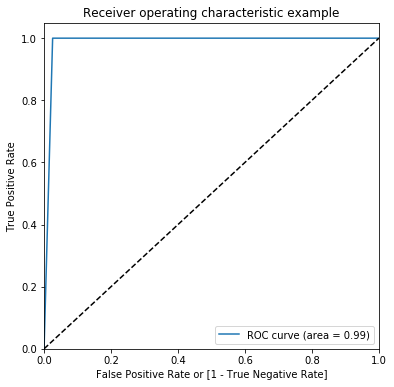

(array([0.        , 0.02555012, 1.        ]),
 array([0., 1., 1.]),
 array([2, 1, 0]))

In [58]:
draw_roc(y_test, y_pred)

### Churn Features Identification:

From Above we can see that our Logistc Regression model is having 100% of Sensitivity which is what we require. i.e. Identifies all the High Value Customers Who are going to Churn.

The Most Important Features which are predicting Customer Churn are as Following



std_ic_t2m_mou_good

std_ic_mou_good

std_ic_t2m_mou_8
	
total_usage
	
loc_ic_t2m_mou_8

offnet_mou_8

onnet_mou_8

loc_ic_t2t_mou_8

loc_ic_t2f_mou_8

roam_og_mou_8

isd_ic_mou_8


# EDA

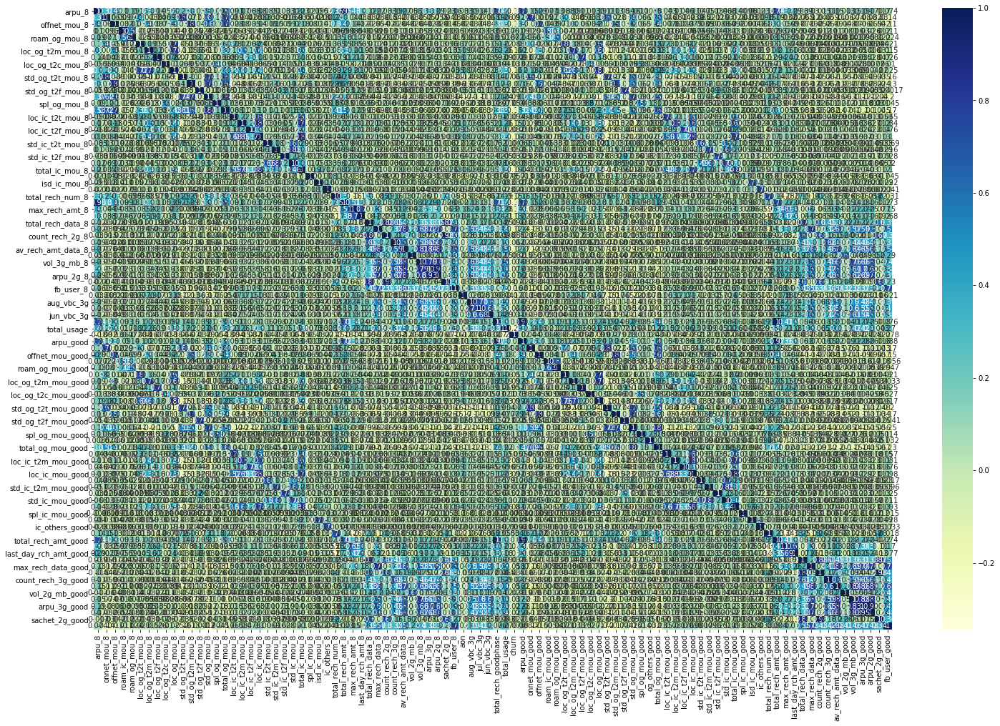

In [59]:
#Created Correlation Matrix for Numerical values
cor = telehv1.corr()
# heatmap
plt.figure(figsize=(25,16))
sns.heatmap(cor, cmap="YlGnBu", annot=True)
plt.show()

In [60]:
telehv1_numeric = telehv1.select_dtypes(include=['float64', 'int64'])
telehv1_numeric.head()
telehv1_numeric.columns
print(telehv1_numeric.shape)

(29991, 93)


In [61]:
cols1 = [1,2,3,4,5,6,7,8,9,10]
cols2 = [11,12,13,14,15,16,17,18,19,20]
cols3 = [31,32,33,34,35,36,37,38,39,40]
cols4 = [41,42,43,44,45,46,47,48,49,50]
cols5 = [51,52,53,54,55,56,57,58,59,60]
cols6 = [61,62,63,64,65,66,67,68,69,70]
cols7 = [71,72,73,74,75,76,77,78,79,80]
cols8 = [81,82,83,84,85,86,87,88,89,90]
cols9 = [91,92]

tpr1 = telehv1_numeric[telehv1_numeric.columns[cols1]]
tpr2 = telehv1_numeric[telehv1_numeric.columns[cols2]]
tpr3 = telehv1_numeric[telehv1_numeric.columns[cols3]]
tpr4 = telehv1_numeric[telehv1_numeric.columns[cols4]]
tpr5 = telehv1_numeric[telehv1_numeric.columns[cols5]]
tpr6 = telehv1_numeric[telehv1_numeric.columns[cols6]]
tpr7 = telehv1_numeric[telehv1_numeric.columns[cols7]]
tpr8 = telehv1_numeric[telehv1_numeric.columns[cols8]]
tpr9 = telehv1_numeric[telehv1_numeric.columns[cols9]]

In [62]:
# correlation matrix
cor1 = tpr1.corr()
cor2 = tpr2.corr()
cor3 = tpr3.corr()
cor4 = tpr4.corr()
cor5 = tpr5.corr()
cor6 = tpr6.corr()
cor7 = tpr7.corr()
cor8 = tpr8.corr()
cor9 = tpr9.corr()

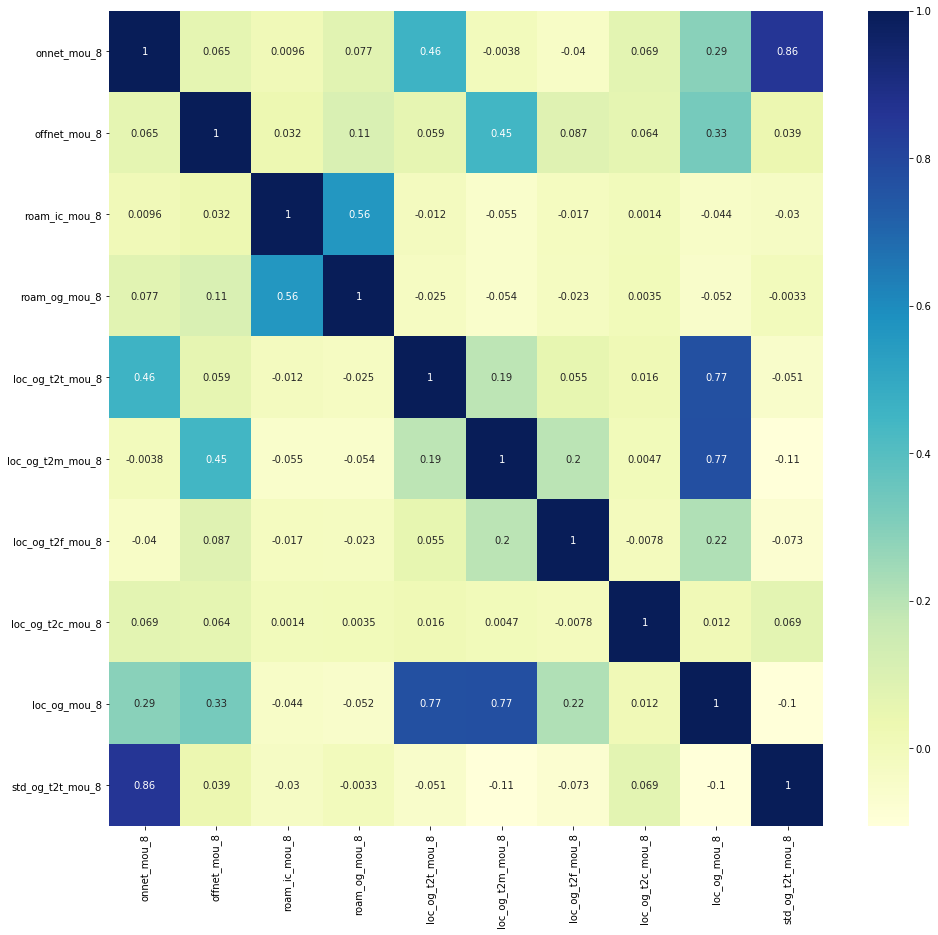

In [63]:
 # plotting correlations on a heatmap

# figure size
plt.figure(figsize=(16,15))

# heatmap
sns.heatmap(cor1, cmap="YlGnBu", annot=True)
plt.show()

In [64]:
### Dropping highly correlated variables.
tpr1.columns

Index(['onnet_mou_8', 'offnet_mou_8', 'roam_ic_mou_8', 'roam_og_mou_8',
       'loc_og_t2t_mou_8', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_8',
       'loc_og_t2c_mou_8', 'loc_og_mou_8', 'std_og_t2t_mou_8'],
      dtype='object')

In [65]:
telehv2 = telehv1.drop(['std_og_t2t_mou_8','loc_og_t2c_mou_8'],1)


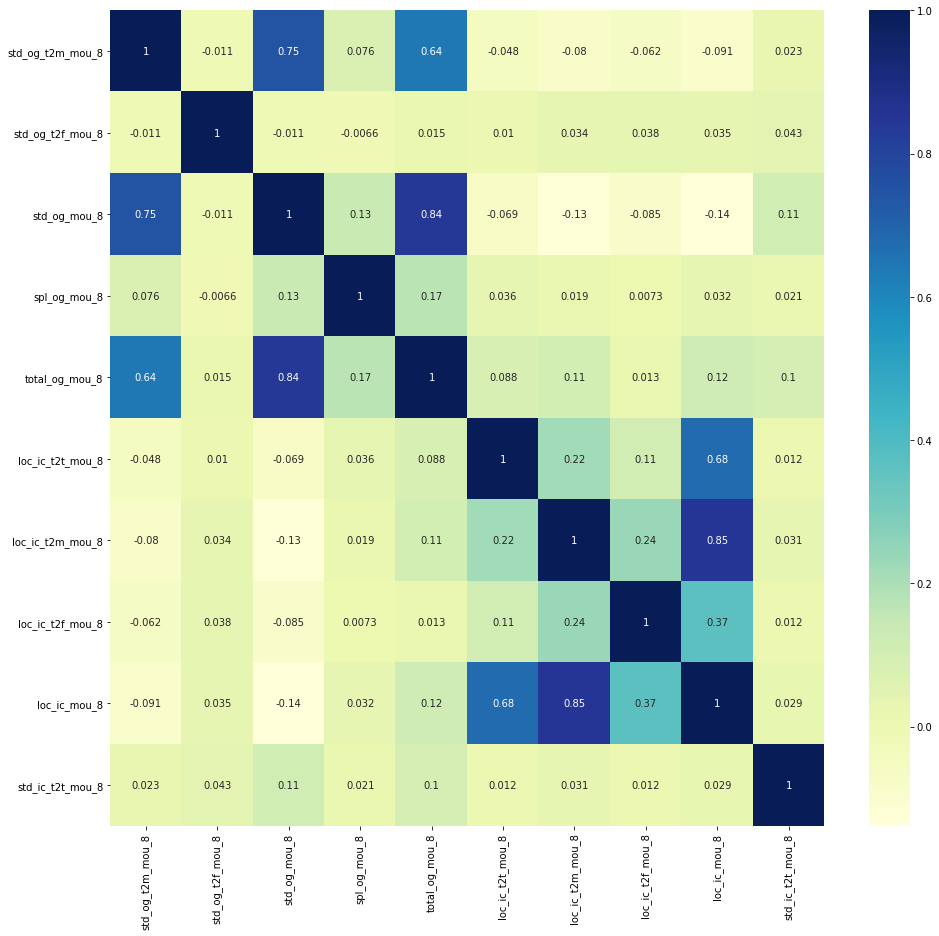

In [66]:
 # plotting correlations on a heatmap

# figure size
plt.figure(figsize=(16,15))

# heatmap
sns.heatmap(cor2, cmap="YlGnBu", annot=True)
plt.show()

In [67]:
### Dropping highly correlated variables.
tpr2.columns

Index(['std_og_t2m_mou_8', 'std_og_t2f_mou_8', 'std_og_mou_8', 'spl_og_mou_8',
       'total_og_mou_8', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8',
       'loc_ic_t2f_mou_8', 'loc_ic_mou_8', 'std_ic_t2t_mou_8'],
      dtype='object')

In [68]:

telehv2 = telehv2.drop(['std_og_t2m_mou_8','std_og_mou_8'],1)


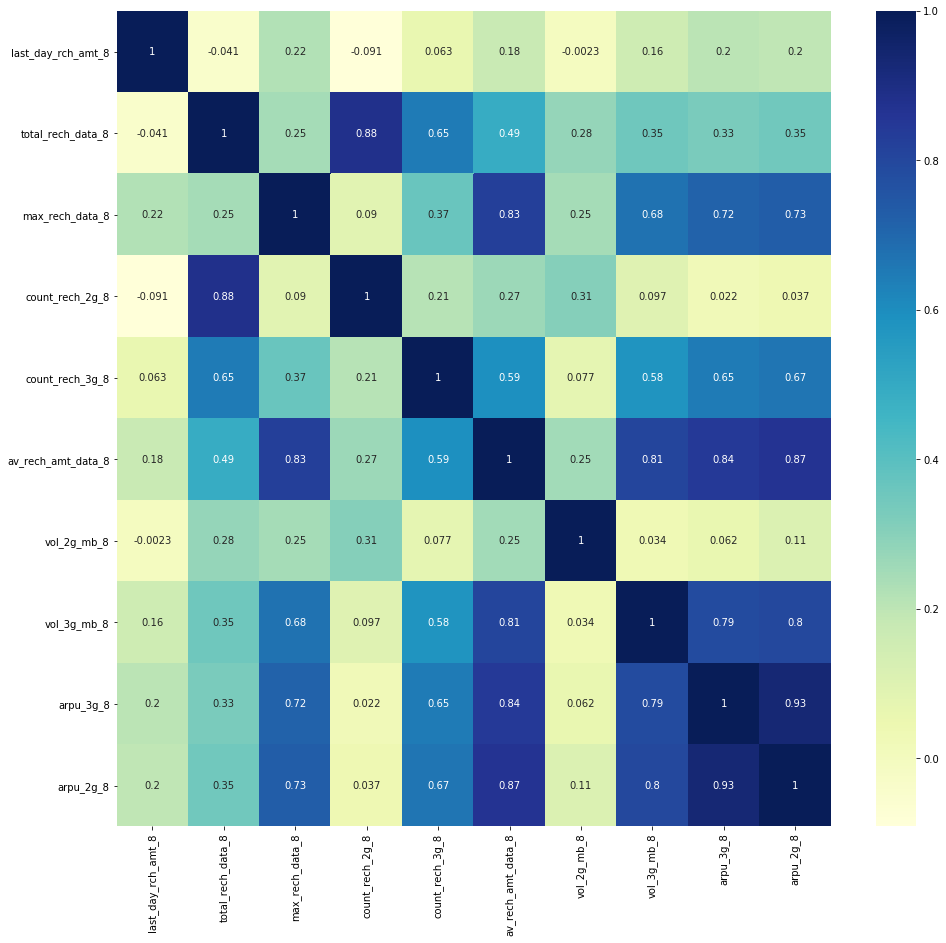

In [69]:
 # plotting correlations on a heatmap

# figure size
plt.figure(figsize=(16,15))

# heatmap
sns.heatmap(cor3, cmap="YlGnBu", annot=True)
plt.show()

In [70]:
### Dropping highly correlated variables.
tpr3.columns

Index(['last_day_rch_amt_8', 'total_rech_data_8', 'max_rech_data_8',
       'count_rech_2g_8', 'count_rech_3g_8', 'av_rech_amt_data_8',
       'vol_2g_mb_8', 'vol_3g_mb_8', 'arpu_3g_8', 'arpu_2g_8'],
      dtype='object')

In [71]:
telehv2.head()

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_mou_8,std_og_t2f_mou_8,spl_og_mou_8,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2m_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,total_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,total_rech_amt_8,max_rech_amt_8,last_day_rch_amt_8,total_rech_data_8,max_rech_data_8,count_rech_2g_8,count_rech_3g_8,av_rech_amt_data_8,vol_2g_mb_8,vol_3g_mb_8,arpu_3g_8,arpu_2g_8,sachet_2g_8,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_rech_goodphase,total_usage,churn,arpu_good,onnet_mou_good,offnet_mou_good,roam_ic_mou_good,roam_og_mou_good,loc_og_t2t_mou_good,loc_og_t2m_mou_good,loc_og_t2f_mou_good,loc_og_t2c_mou_good,loc_og_mou_good,std_og_t2t_mou_good,std_og_t2m_mou_good,std_og_t2f_mou_good,std_og_mou_good,spl_og_mou_good,og_others_good,total_og_mou_good,loc_ic_t2t_mou_good,loc_ic_t2m_mou_good,loc_ic_t2f_mou_good,loc_ic_mou_good,std_ic_t2t_mou_good,std_ic_t2m_mou_good,std_ic_t2f_mou_good,std_ic_mou_good,total_ic_mou_good,spl_ic_mou_good,isd_ic_mou_good,ic_others_good,total_rech_num_good,total_rech_amt_good,max_rech_amt_good,last_day_rch_amt_good,total_rech_data_good,max_rech_data_good,count_rech_2g_good,count_rech_3g_good,av_rech_amt_data_good,vol_2g_mb_good,vol_3g_mb_good,arpu_3g_good,arpu_2g_good,sachet_2g_good,fb_user_good
0,3171.480,52.29,325.91,31.64,38.06,40.28,162.28,53.23,255.79,16.68,6.50,350.16,27.31,121.19,39.53,188.04,30.39,141.33,22.21,193.94,428.74,0.0,31.59,15.14,7,3638,1580,779,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0,0.0,802,57.74,19.38,18.74,2370.0,0.00,1,1209.5150,56.260,510.295,24.860,18.165,41.385,378.005,58.635,0.0,478.035,13.795,40.825,13.37,68.000,2.25,0.000,548.385,45.200,219.525,126.810,391.555,24.360,109.215,43.215,176.810,592.250,0.105,8.295,15.465,5.0,1185.0,1185.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0
1,137.362,35.08,136.48,0.00,0.00,12.49,50.54,0.00,63.04,0.00,10.23,171.56,0.31,15.48,0.00,15.79,0.10,0.65,0.00,0.75,16.54,0.0,0.00,0.00,14,120,30,10,3.0,23.0,3.0,0.0,69.0,0.03,11.94,19.83,0.0,3,1.0,315,21.03,910.65,122.16,1040.0,177.09,0,435.4720,382.360,87.645,0.000,0.000,257.360,75.770,0.000,0.0,333.135,124.995,11.865,0.00,136.870,0.00,0.000,470.010,16.840,35.780,0.000,52.630,0.290,13.255,0.000,13.545,66.175,0.000,0.000,0.000,20.0,519.0,122.0,25.0,1.0,77.0,1.0,0.0,88.5,178.0,375.475,0.0,0.0,0.5,0.5
2,593.260,534.24,482.46,72.11,1.44,36.01,294.46,23.51,353.99,0.00,4.78,1015.26,52.58,195.18,7.49,255.26,154.58,317.91,1.91,474.41,1144.53,0.0,393.39,21.44,11,717,130,0,3.0,23.0,3.0,0.0,69.0,0.02,0.00,0.00,0.2,3,1.0,2607,0.00,0.00,0.00,760.0,1077.95,0,349.2585,305.075,266.295,83.885,21.620,27.910,99.205,2.270,0.0,129.395,266.195,154.150,0.00,420.355,0.00,0.000,549.750,37.730,80.705,2.405,120.845,76.985,168.960,0.000,245.950,570.595,0.225,153.695,49.860,5.0,380.0,110.0,80.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0
3,187.894,70.61,162.76,0.00,0.00,67.38,128.28,10.26,205.93,0.00,5.91,233.38,28.89,150.16,32.71,211.78,6.33,73.93,2.18,82.44,294.46,0.0,0.23,0.00,2,160,130,130,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0,0.0,511,0.00,2.45,21.89,918.0,590.30,0,365.4220,62.260,263.015,1.415,8.870,53.885,209.640,2.240,0.0,265.775,5.235,43.750,0.00,48.990,1.63,0.000,316.410,56.385,188.250,8.695,253.345,73.715,45.880,0.255,119.860,373.210,0.000,0.000,0.000,8.0,459.0,110.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0
4,25.499,7.79,5.54,4.81,13.34,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,4,30,30,0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0,0.0,667,0.00,0.00,0.00,816.0,718.21,0,354.4940,597.595,30.820,2.380,4.230,19.495,29.270,0.000,0.0,48.770,573.860,0.775,0.00,574.635,1.29,0.465,625.170,17.270,24.860,0.000,42.135,4.315,0.640,0.000,4.955,47.095,0.000,0.000,0.000,10.5,408.0,55.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0


In [72]:
telehv2 = telehv2.drop(['count_rech_2g_8','max_rech_data_8','vol_3g_mb_8','arpu_3g_8'],1)


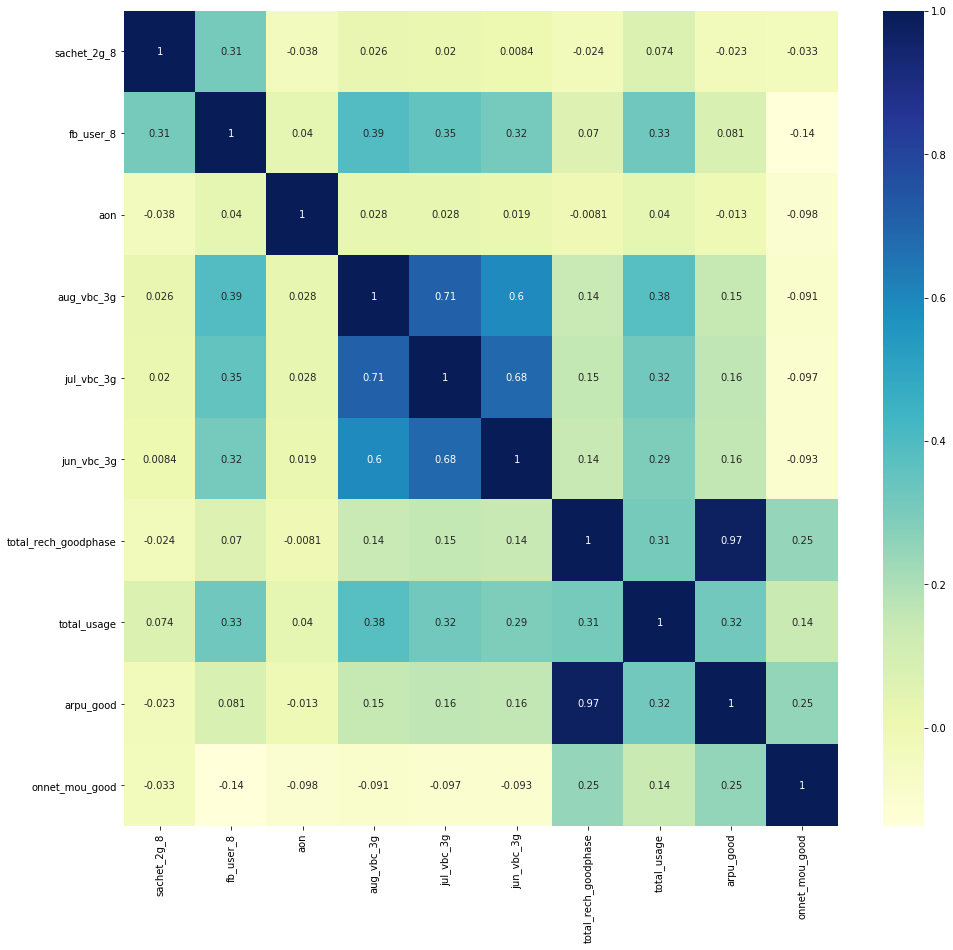

In [73]:
 # plotting correlations on a heatmap

# figure size
plt.figure(figsize=(16,15))

# heatmap
sns.heatmap(cor4, cmap="YlGnBu", annot=True)
plt.show()

In [74]:
### Dropping highly correlated variables.
tpr4.columns

Index(['sachet_2g_8', 'fb_user_8', 'aon', 'aug_vbc_3g', 'jul_vbc_3g',
       'jun_vbc_3g', 'total_rech_goodphase', 'total_usage', 'arpu_good',
       'onnet_mou_good'],
      dtype='object')

In [75]:
telehv2 = telehv2.drop(['arpu_good'],1)


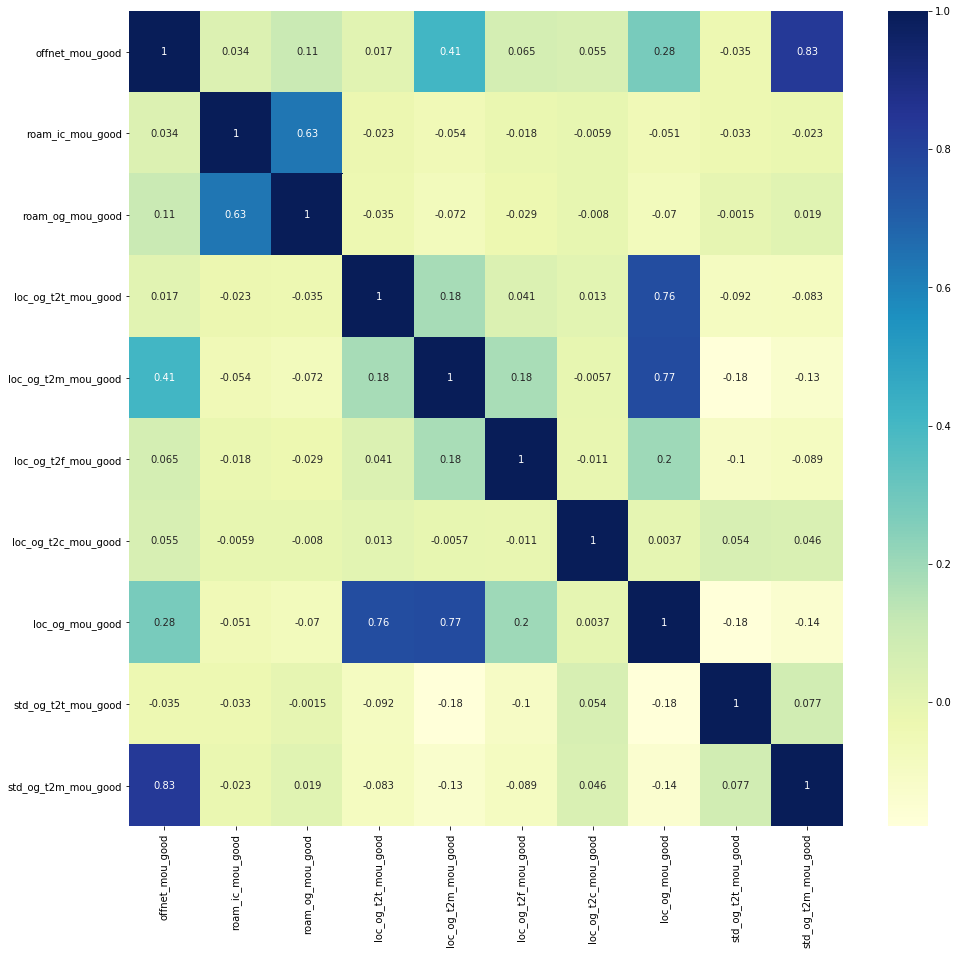

In [76]:
 # plotting correlations on a heatmap

# figure size
plt.figure(figsize=(16,15))

# heatmap
sns.heatmap(cor5, cmap="YlGnBu", annot=True)
plt.show()

In [77]:
### Dropping highly correlated variables.
tpr5.columns

Index(['offnet_mou_good', 'roam_ic_mou_good', 'roam_og_mou_good',
       'loc_og_t2t_mou_good', 'loc_og_t2m_mou_good', 'loc_og_t2f_mou_good',
       'loc_og_t2c_mou_good', 'loc_og_mou_good', 'std_og_t2t_mou_good',
       'std_og_t2m_mou_good'],
      dtype='object')

In [78]:
telehv2 = telehv2.drop(['std_og_t2t_mou_good'],1)


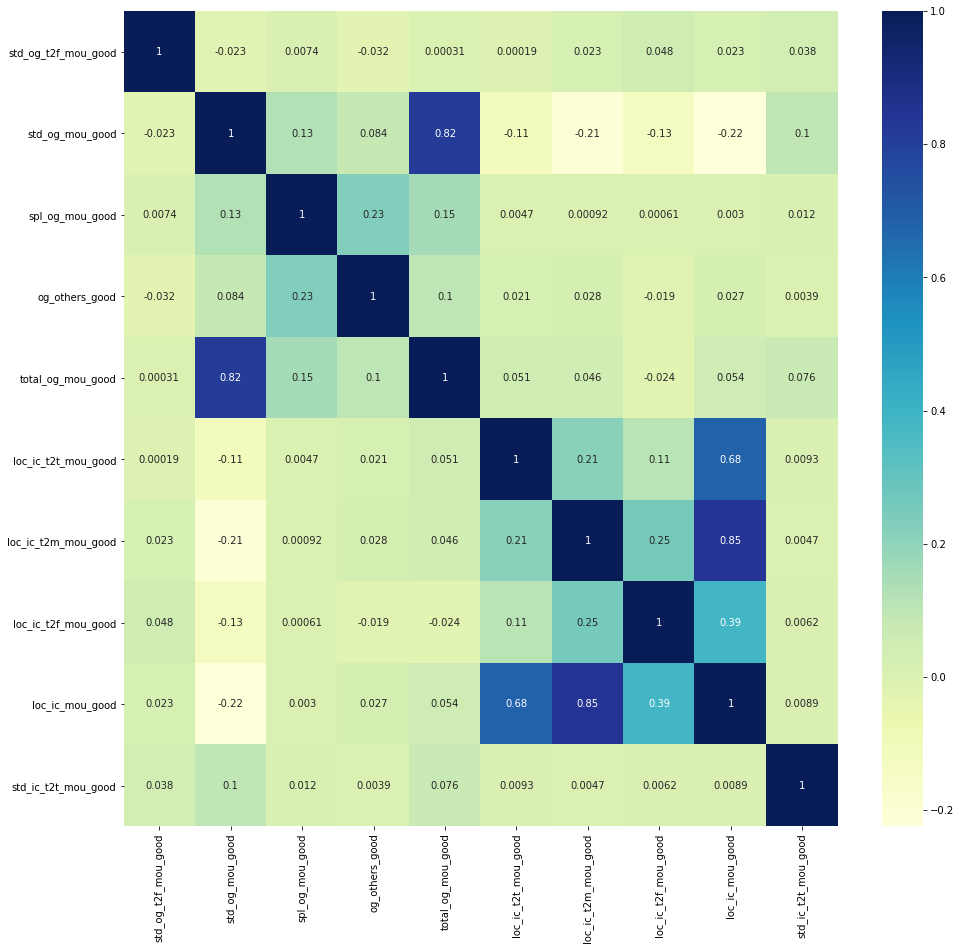

In [79]:
 # plotting correlations on a heatmap

# figure size
plt.figure(figsize=(16,15))

# heatmap
sns.heatmap(cor6, cmap="YlGnBu", annot=True)
plt.show()

In [80]:
### Dropping highly correlated variables.
tpr6.columns

Index(['std_og_t2f_mou_good', 'std_og_mou_good', 'spl_og_mou_good',
       'og_others_good', 'total_og_mou_good', 'loc_ic_t2t_mou_good',
       'loc_ic_t2m_mou_good', 'loc_ic_t2f_mou_good', 'loc_ic_mou_good',
       'std_ic_t2t_mou_good'],
      dtype='object')

In [81]:
telehv2 = telehv2.drop(['loc_ic_t2m_mou_good','std_og_mou_good'],1)


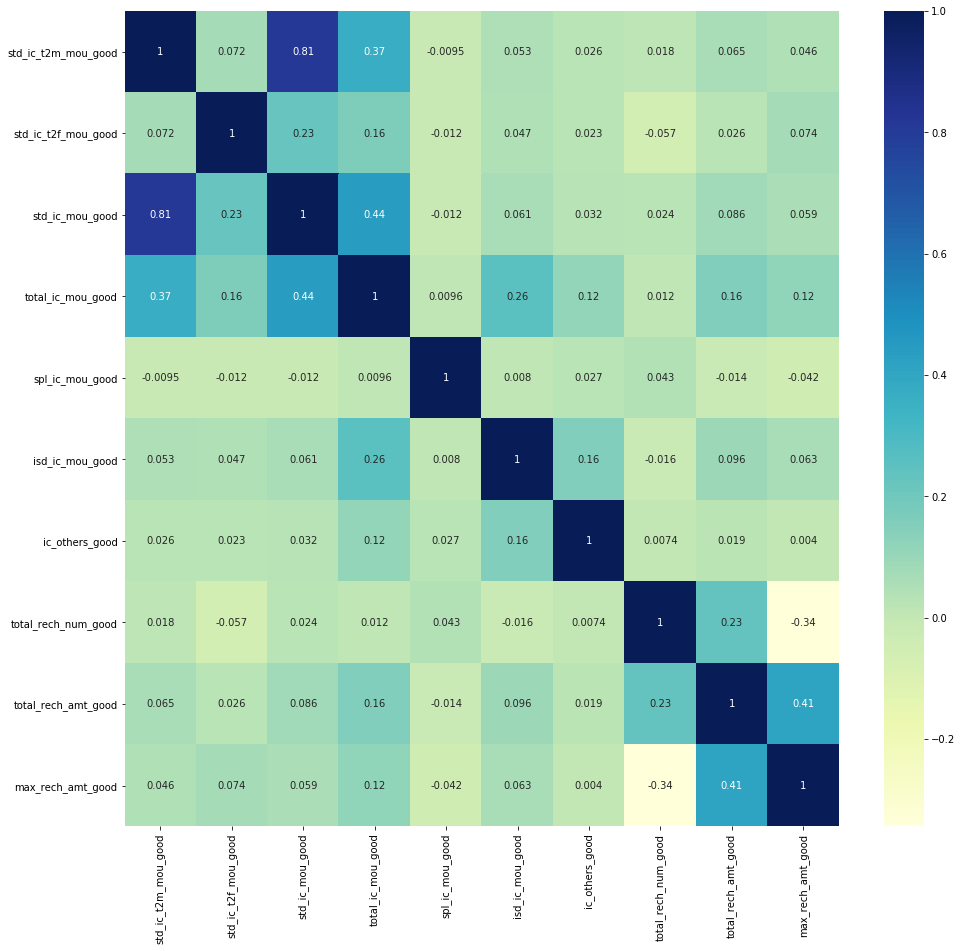

In [82]:
 # plotting correlations on a heatmap

# figure size
plt.figure(figsize=(16,15))

# heatmap
sns.heatmap(cor7, cmap="YlGnBu", annot=True)
plt.show()

In [83]:
### Dropping highly correlated variables.
tpr7.columns

Index(['std_ic_t2m_mou_good', 'std_ic_t2f_mou_good', 'std_ic_mou_good',
       'total_ic_mou_good', 'spl_ic_mou_good', 'isd_ic_mou_good',
       'ic_others_good', 'total_rech_num_good', 'total_rech_amt_good',
       'max_rech_amt_good'],
      dtype='object')

In [84]:
telehv2 = telehv2.drop(['std_ic_t2m_mou_good'],1)


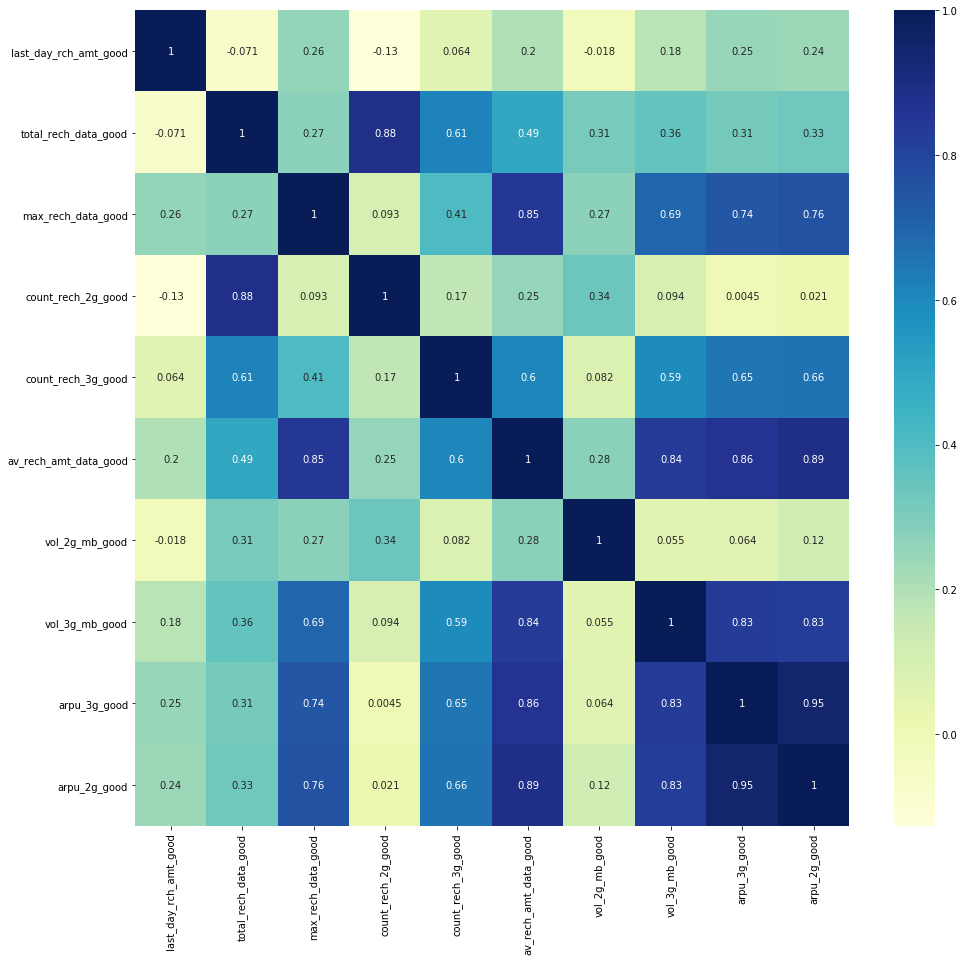

In [85]:
 # plotting correlations on a heatmap

# figure size
plt.figure(figsize=(16,15))

# heatmap
sns.heatmap(cor8, cmap="YlGnBu", annot=True)
plt.show()

In [86]:
### Dropping highly correlated variables.
tpr8.columns

Index(['last_day_rch_amt_good', 'total_rech_data_good', 'max_rech_data_good',
       'count_rech_2g_good', 'count_rech_3g_good', 'av_rech_amt_data_good',
       'vol_2g_mb_good', 'vol_3g_mb_good', 'arpu_3g_good', 'arpu_2g_good'],
      dtype='object')

In [87]:
telehv2 = telehv2.drop(['count_rech_2g_good','max_rech_data_good','vol_3g_mb_good','arpu_3g_good'],1)


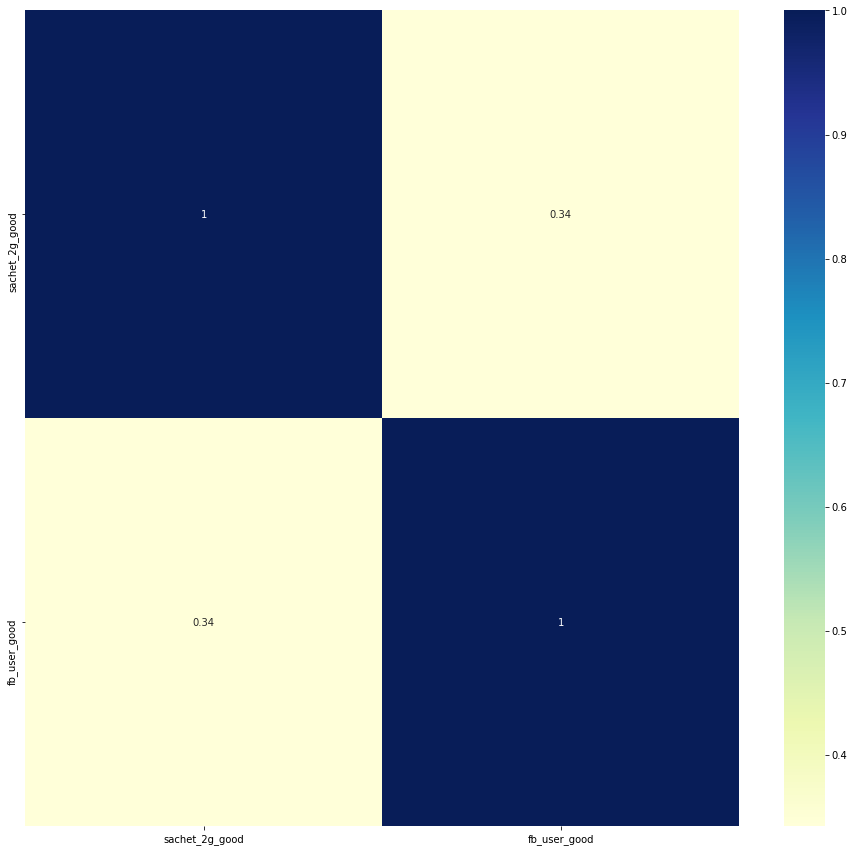

In [88]:
 # plotting correlations on a heatmap

# figure size
plt.figure(figsize=(16,15))

# heatmap
sns.heatmap(cor9, cmap="YlGnBu", annot=True)
plt.show()

In [89]:
### Checking the Correlation Matrix
##After dropping highly correlated variables now let's check the correlation matrix again.

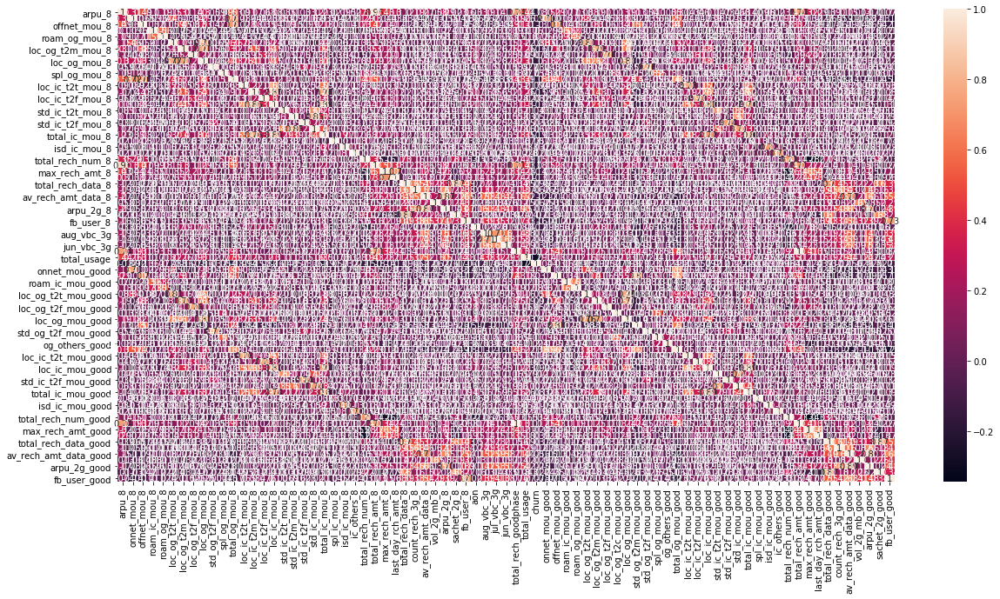

In [90]:
plt.figure(figsize = (20,10))
sns.heatmap(telehv2.corr(),annot = True)

In [91]:
### Checking for Outliers

In [92]:
# Checking for outliers in the continuous variables
numeric_telehv1 = telehv1[['total_rech_amt_8','last_day_rch_amt_8','total_rech_goodphase','total_rech_amt_good']]

In [93]:
# Checking outliers at 25%,50%,75%,90%,95% and 99%
numeric_telehv1.describe(percentiles=[.25,.5,.75,.90,.95,.99])

,total_rech_amt_8,last_day_rch_amt_8,total_rech_goodphase,total_rech_amt_good
count,29991.000000,29991.000000,29991.000000,29991.000000
mean,613.781668,95.634957,1395.768264,696.876896
std,601.977759,145.306460,977.983381,488.875855
min,0.000000,0.000000,740.000000,330.500000
25%,309.000000,0.000000,902.000000,450.000000
50%,520.000000,50.000000,1140.000000,569.000000
75%,790.000000,130.000000,1594.000000,796.000000
90%,1155.000000,225.000000,2238.000000,1118.000000
95%,1494.000000,252.000000,2816.500000,1406.250000
99%,2342.100000,619.000000,4436.100000,2217.000000


In [94]:
telehv2.head()

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_mou_8,std_og_t2f_mou_8,spl_og_mou_8,total_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,loc_ic_mou_8,std_ic_t2t_mou_8,std_ic_t2m_mou_8,std_ic_t2f_mou_8,std_ic_mou_8,total_ic_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_num_8,total_rech_amt_8,max_rech_amt_8,last_day_rch_amt_8,total_rech_data_8,count_rech_3g_8,av_rech_amt_data_8,vol_2g_mb_8,arpu_2g_8,sachet_2g_8,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_rech_goodphase,total_usage,churn,onnet_mou_good,offnet_mou_good,roam_ic_mou_good,roam_og_mou_good,loc_og_t2t_mou_good,loc_og_t2m_mou_good,loc_og_t2f_mou_good,loc_og_t2c_mou_good,loc_og_mou_good,std_og_t2m_mou_good,std_og_t2f_mou_good,spl_og_mou_good,og_others_good,total_og_mou_good,loc_ic_t2t_mou_good,loc_ic_t2f_mou_good,loc_ic_mou_good,std_ic_t2t_mou_good,std_ic_t2f_mou_good,std_ic_mou_good,total_ic_mou_good,spl_ic_mou_good,isd_ic_mou_good,ic_others_good,total_rech_num_good,total_rech_amt_good,max_rech_amt_good,last_day_rch_amt_good,total_rech_data_good,count_rech_3g_good,av_rech_amt_data_good,vol_2g_mb_good,arpu_2g_good,sachet_2g_good,fb_user_good
0,3171.480,52.29,325.91,31.64,38.06,40.28,162.28,53.23,255.79,16.68,6.50,350.16,27.31,121.19,39.53,188.04,30.39,141.33,22.21,193.94,428.74,0.0,31.59,15.14,7,3638,1580,779,0.0,0.0,0.0,0.00,0.0,0,0.0,802,57.74,19.38,18.74,2370.0,0.00,1,56.260,510.295,24.860,18.165,41.385,378.005,58.635,0.0,478.035,40.825,13.37,2.25,0.000,548.385,45.200,126.810,391.555,24.360,43.215,176.810,592.250,0.105,8.295,15.465,5.0,1185.0,1185.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,137.362,35.08,136.48,0.00,0.00,12.49,50.54,0.00,63.04,0.00,10.23,171.56,0.31,15.48,0.00,15.79,0.10,0.65,0.00,0.75,16.54,0.0,0.00,0.00,14,120,30,10,3.0,0.0,69.0,0.03,0.0,3,1.0,315,21.03,910.65,122.16,1040.0,177.09,0,382.360,87.645,0.000,0.000,257.360,75.770,0.000,0.0,333.135,11.865,0.00,0.00,0.000,470.010,16.840,0.000,52.630,0.290,0.000,13.545,66.175,0.000,0.000,0.000,20.0,519.0,122.0,25.0,1.0,0.0,88.5,178.0,0.0,0.5,0.5
2,593.260,534.24,482.46,72.11,1.44,36.01,294.46,23.51,353.99,0.00,4.78,1015.26,52.58,195.18,7.49,255.26,154.58,317.91,1.91,474.41,1144.53,0.0,393.39,21.44,11,717,130,0,3.0,0.0,69.0,0.02,0.2,3,1.0,2607,0.00,0.00,0.00,760.0,1077.95,0,305.075,266.295,83.885,21.620,27.910,99.205,2.270,0.0,129.395,154.150,0.00,0.00,0.000,549.750,37.730,2.405,120.845,76.985,0.000,245.950,570.595,0.225,153.695,49.860,5.0,380.0,110.0,80.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,187.894,70.61,162.76,0.00,0.00,67.38,128.28,10.26,205.93,0.00,5.91,233.38,28.89,150.16,32.71,211.78,6.33,73.93,2.18,82.44,294.46,0.0,0.23,0.00,2,160,130,130,0.0,0.0,0.0,0.00,0.0,0,0.0,511,0.00,2.45,21.89,918.0,590.30,0,62.260,263.015,1.415,8.870,53.885,209.640,2.240,0.0,265.775,43.750,0.00,1.63,0.000,316.410,56.385,8.695,253.345,73.715,0.255,119.860,373.210,0.000,0.000,0.000,8.0,459.0,110.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,25.499,7.79,5.54,4.81,13.34,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,4,30,30,0,0.0,0.0,0.0,0.00,0.0,0,0.0,667,0.00,0.00,0.00,816.0,718.21,0,597.595,30.820,2.380,4.230,19.495,29.270,0.000,0.0,48.770,0.775,0.00,1.29,0.465,625.170,17.270,0.000,42.135,4.315,0.000,4.955,47.095,0.000,0.000,0.000,10.5,408.0,55.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [95]:
#Handling Outliers for Recharge Columns

telehvoutremove = telehv2[(telehv2['total_rech_amt_8'] <= 2342) & (telehv2['last_day_rch_amt_8'] <= 619) & (telehv2['total_rech_goodphase'] <= 4436) & (telehv2['total_rech_amt_good'] <= 2217)]

telehvoutremove.shape

(29296, 77)

# PCA Model Building with Partial Supervision and Scree Plots

Let's start by splitting our data into a training set and a test set.


In [96]:
from sklearn.model_selection import train_test_split

# Putting feature variable to X
X2 = telehvoutremove.drop(['churn'],axis=1)

# Putting response variable to y
y2 = telehvoutremove['churn']

y2.head()

1    0
2    0
3    0
4    0
5    0
Name: churn, dtype: int32

In [97]:
# Splitting the data into train and test
X2_train, X2_test, y2_train, y2_test = train_test_split(X2,y2, train_size=0.7,test_size=0.3,random_state=100)

In [98]:
### Running Your First Training Model

In [99]:
import statsmodels.api as sm

In [100]:
# Logistic regression model
logm1 = sm.GLM(y2_train,(sm.add_constant(X2_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  churn   No. Observations:                20507
Model:                            GLM   Df Residuals:                    20431
Model Family:                Binomial   Df Model:                           75
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Tue, 01 Sep 2020   Deviance:                          nan
Time:                        08:22:23   Pearson chi2:                 5.27e+18
No. Iterations:                   100                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                  5.714e+14   1.81e+06   3.15e+08      0.000    5.71e+14    5.71e+14
arpu_8                 2.612e+10   5318.008   4.91e+06      0.000    2.61e+10    2.61e+10
onnet_mou_8            4.624e+12   5.25e+04    8.8e+07      0.000    4.62e+12    4.62e+12
offnet_mou_8           4.644e+12   5.24e+04   8.86e+07      0.000    4.64e+12    4.64e+12
roam_ic_mou_8         -1.094e+10   1.01e+04  -1.09e+06      0.000   -1.09e+10   -1.09e+10
roam_og_mou_8         -4.447e+12   5.29e+04  -8.41e+07      0.000   -4.45e+12   -4.45e+12
loc_og_t2t_mou_8       7.766e+15   8.11e+07   9.58e+07      0.000    7.77e+15    7.77e+15
loc_og_t2m_mou_8       7.767e+15   8.11e+07   9.58e+07      0.000    7.77e+15    7.77e+15
loc_og_t2f_mou_8       7.768e+15   8.11e+07   9.58e+07      0.000    7.77e+15    7.77e+15
loc_og_mou_8          -7.766e+15   8.11e+07  -9.58e+07      0.000   -7.77e+15   -7.77e+15
std_og_t2f_mou_8       6.926e+11   5.96e+04   1.16e+07      0.000    6.93e+11    6.93e+11
spl_og_mou_8          -4.666e+11   2.75e+04   -1.7e+07      0.000   -4.67e+11   -4.67e+11
total_og_mou_8        -4.709e+12   5.25e+04  -8.97e+07      0.000   -4.71e+12   -4.71e+12
loc_ic_t2t_mou_8       2.463e+16   7.97e+07   3.09e+08      0.000    2.46e+16    2.46e+16
loc_ic_t2m_mou_8       2.463e+16   7.97e+07   3.09e+08      0.000    2.46e+16    2.46e+16
loc_ic_t2f_mou_8       2.463e+16   7.97e+07   3.09e+08      0.000    2.46e+16    2.46e+16
loc_ic_mou_8          -1.891e+16   6.74e+07   -2.8e+08      0.000   -1.89e+16   -1.89e+16
std_ic_t2t_mou_8       5.618e+15   9.33e+07   6.02e+07      0.000    5.62e+15    5.62e+15
std_ic_t2m_mou_8       5.618e+15   9.33e+07   6.02e+07      0.000    5.62e+15    5.62e+15
std_ic_t2f_mou_8       5.616e+15   9.33e+07   6.02e+07      0.000    5.62e+15    5.62e+15
std_ic_mou_8           9.989e+13   9.25e+07   1.08e+06      0.000    9.99e+13    9.99e+13
total_ic_mou_8        -5.718e+15   1.62e+07  -3.52e+08      0.000   -5.72e+15   -5.72e+15
spl_ic_mou_8           4.776e+15    1.7e+07    2.8e+08      0.000    4.78e+15    4.78e+15
isd_ic_mou_8           5.718e+15   1.62e+07   3.52e+08      0.000    5.72e+15    5.72e+15
ic_others_8            5.718e+15   1.62e+07   3.52e+08      0.000    5.72e+15    5.72e+15
total_rech_num_8      -7.457e+12   1.06e+05  -7.01e+07      0.000   -7.46e+12   -7.46e+12
total_rech_amt_8      -1.552e+10   4417.682  -3.51e+06      0.000   -1.55e+10   -1.55e+10
max_rech_amt_8         1.775e+10   6319.532   2.81e+06      0.000    1.77e+10    1.77e+10
last_day_rch_amt_8    -7.742e+11   6133.433  -1.26e+08      0.000   -7.74e+11   -7.74e+11
total_rech_data_8     -2.906e+13   2.18e+06  -1.33e+07      0.000   -2.91e+13   -2.91e+13
count_rech_3g_8        3.108e+13    2.3e+06   1.35e+07      0.000    3.11e+13    3.11e+13
av_rech_amt_data_8     

In [101]:
### Correlation Matrix

In [102]:
# Importing matplotlib and seaborn
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

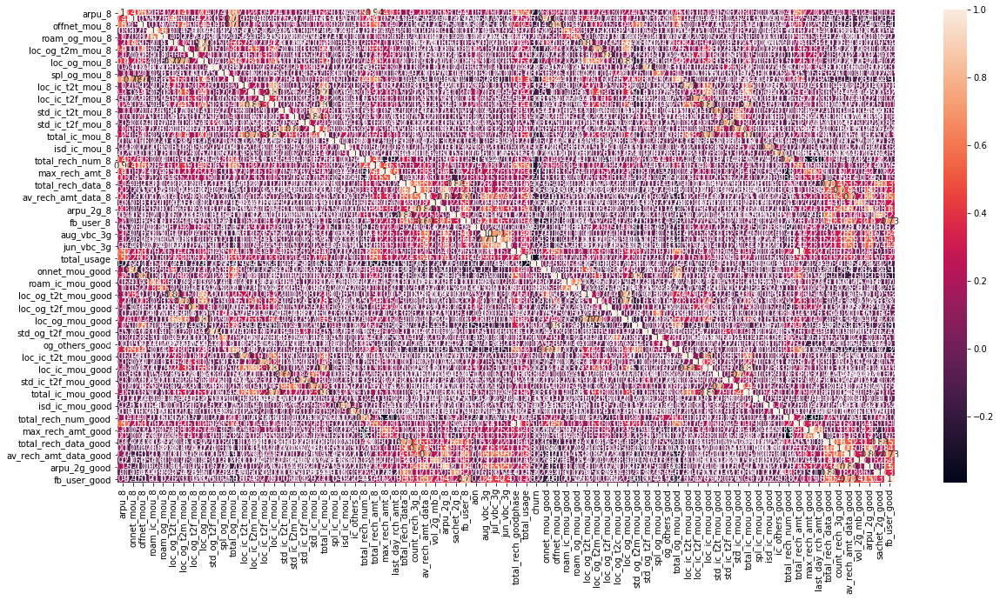

In [103]:
# Let's see the correlation matrix 
plt.figure(figsize = (20,10))        # Size of the figure
sns.heatmap(telehvoutremove.corr(),annot = True)

In [104]:
### PCA on the data# import model and matrics
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, RepeatedStratifiedKFold, StratifiedKFold
from sklearn.metrics import accuracy_score, confusion_matrix,roc_curve, roc_auc_score, precision_score, recall_score, precision_recall_curve
from sklearn.metrics import f1_score

In [105]:
X2_train.shape

(20507, 76)

In [106]:
from sklearn.decomposition import PCA

In [107]:
pca = PCA(random_state=42)

In [108]:
pca.fit(X2_train)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=42,
    svd_solver='auto', tol=0.0, whiten=False)

In [109]:
pca.components_

array([[ 1.82731793e-01,  1.51731885e-01,  1.72497369e-01, ...,
         1.86332338e-02,  8.20704940e-06,  4.36703955e-05],
       [-1.30137464e-02, -1.12586294e-01, -8.14038993e-02, ...,
         2.04929751e-02, -1.38049377e-05,  9.21938751e-05],
       [-4.59973794e-02, -1.29977861e-01, -1.48883277e-01, ...,
         5.78959689e-02,  2.48112067e-04,  2.04969183e-04],
       ...,
       [ 4.62113822e-07, -1.82037505e-06, -1.76580864e-06, ...,
        -7.29307551e-07,  3.50245895e-05,  1.51786176e-04],
       [-1.95814725e-08,  1.42139798e-06,  1.14943249e-06, ...,
        -5.31523105e-07,  1.38917515e-04, -8.96189022e-05],
       [-0.00000000e+00,  9.24587307e-15,  8.91011214e-15, ...,
         1.56047575e-15,  5.22004526e-15, -1.50457808e-15]])

In [110]:
##Explained variance ratio for each component
pca.explained_variance_ratio_

array([3.08776389e-01, 1.70334110e-01, 1.30128558e-01, 6.59285832e-02,
       6.54502943e-02, 5.43110285e-02, 3.93350319e-02, 2.94843115e-02,
       2.64756207e-02, 1.69107003e-02, 1.02188723e-02, 9.87750439e-03,
       8.85997627e-03, 7.90028614e-03, 7.43262735e-03, 6.99001726e-03,
       5.44848670e-03, 4.26799984e-03, 3.98341998e-03, 3.57490363e-03,
       3.51072476e-03, 3.41810245e-03, 2.32981249e-03, 1.71355468e-03,
       1.70970854e-03, 1.51916606e-03, 1.31951691e-03, 1.16742556e-03,
       1.04940053e-03, 9.45979873e-04, 7.07809908e-04, 6.80906506e-04,
       6.27750576e-04, 5.98469312e-04, 5.14102810e-04, 4.94584940e-04,
       4.31700690e-04, 2.67986138e-04, 2.14396574e-04, 2.11977652e-04,
       1.55716256e-04, 1.38692500e-04, 1.22737327e-04, 1.07026955e-04,
       7.45941791e-05, 6.67860165e-05, 5.52691380e-05, 3.12582749e-05,
       2.91931924e-05, 1.95553661e-05, 1.88680768e-05, 1.44892705e-05,
       1.18470018e-05, 1.03094768e-05, 5.50820442e-06, 5.37138559e-06,
      

In [111]:
##Scree plot
var_cumu = np.cumsum(pca.explained_variance_ratio_)

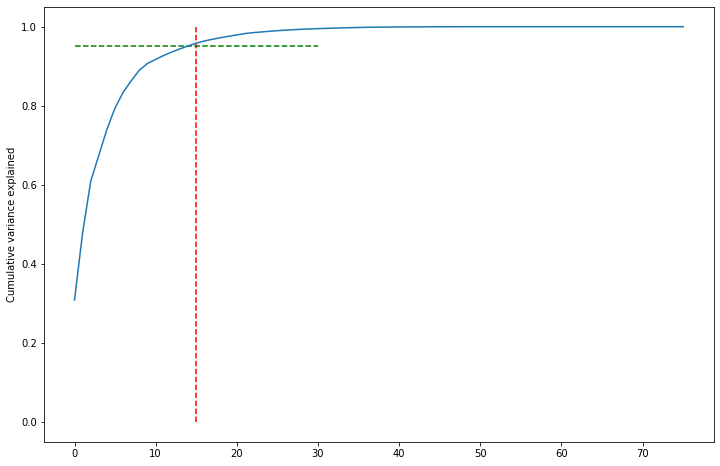

In [112]:
fig = plt.figure(figsize=[12,8])
plt.vlines(x=15, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.95, xmax=30, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.ylabel("Cumulative variance explained")
plt.show()

In [113]:
## Based on the above graph we use 17 comoponents for PCA

In [114]:
from sklearn.decomposition import IncrementalPCA

In [115]:
pca_final = IncrementalPCA(n_components=17)
df_train_pca = pca_final.fit_transform(X2_train)
df_train_pca.shape

(20507, 17)

In [116]:
corrmat = np.corrcoef(df_train_pca.transpose())
corrmat.shape

(17, 17)

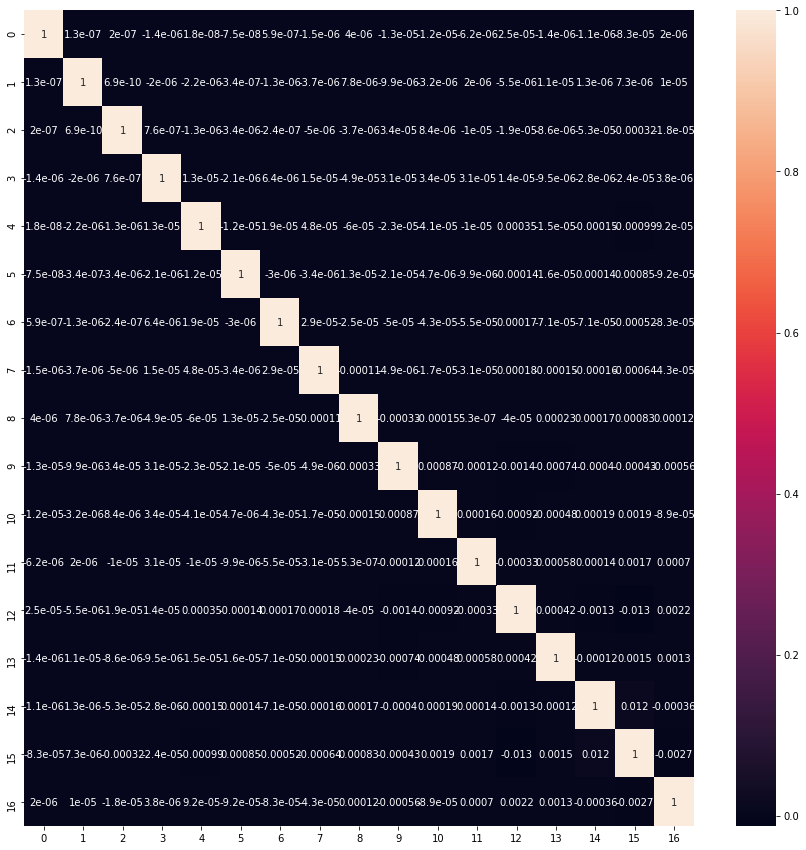

In [117]:
##Correlation Matrix
plt.figure(figsize=[15,15])
sns.heatmap(corrmat, annot=True)

In [118]:
## We cab now confirm that there is minimal co relation between the PCA chosen components

In [119]:
##Applying the transformation on the test set
df_test_pca = pca_final.transform(X2_test)
df_test_pca.shape

(8789, 17)

In [120]:
##logistic regression on the data on our PCA components

In [121]:
from sklearn.linear_model import LogisticRegression

In [122]:
learner_pca = LogisticRegression()
model_pca = learner_pca.fit(df_train_pca, y2_train)

In [123]:
## Applying PCA model on test set
from sklearn import metrics

In [124]:
pred_probs_test = model_pca.predict_proba(df_test_pca)

In [125]:
"{:2.2}".format(metrics.roc_auc_score(y2_test, pred_probs_test[:,1]))

'1.0'

In [126]:
### Making Predictions

In [127]:
# Predicted probabilities
y2_pred = model_pca.predict_proba(df_test_pca)
# Converting y_pred to a dataframe which is an array
y2_pred_df = pd.DataFrame(y2_pred)
# Converting to column dataframe
y2_pred_1 = y2_pred_df.iloc[:,[1]]
# Let's see the head
y2_pred_1.head()

,1
0,3.432538e-31
1,7.840478e-01
2,3.066905e-23
3,1.238837e-56
4,4.129596e-155


In [128]:
# Converting y_test to dataframe
y2_test_df = pd.DataFrame(y2_test)
y2_test_df.head()

,churn
3929,0
19449,0
21429,0
998,0
25631,0


In [129]:
# Putting CustID to index,
y2_test_df['customerID'] = y2_test_df.index
y2_pred_1.reset_index(drop=True, inplace=True)
y2_test_df.reset_index(drop=True, inplace=True)
y2_pred_final = pd.concat([y2_test_df,y2_pred_1],axis=1)
y2_pred_final= y2_pred_final.rename(columns={ 1 : 'Churn_Prob'})
# Let's see the head of y_pred_final
y2_pred_final.head()

,churn,customerID,Churn_Prob
0,0,3929,3.432538e-31
1,0,19449,7.840478e-01
2,0,21429,3.066905e-23
3,0,998,1.238837e-56
4,0,25631,4.129596e-155


In [130]:
# Creating new column 'predicted' with 1 if Churn_Prob>0.5 else 0
y2_pred_final['predicted'] = y2_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.5 else 0)
# Let's see the head
y2_pred_final.head()

,churn,customerID,Churn_Prob,predicted
0,0,3929,3.432538e-31,0
1,0,19449,7.840478e-01,1
2,0,21429,3.066905e-23,0
3,0,998,1.238837e-56,0
4,0,25631,4.129596e-155,0


In [131]:
### Model Evaluation

In [132]:
from sklearn import metrics

In [133]:
# Confusion matrix 
confusion = metrics.confusion_matrix( y2_pred_final.churn, y2_pred_final.predicted )
confusion

array([[7982,   81],
       [  14,  712]], dtype=int64)

In [134]:
#Accuracy Check
metrics.accuracy_score(y2_pred_final.churn, y2_pred_final.predicted)

0.9891910342473547

In [135]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 6))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return fpr, tpr, thresholds

In [136]:
# performance
print(f'Accuracy Score: {accuracy_score(y2_pred_final.churn,y2_pred_final.predicted)}')
print(f'Confusion Matrix: \n{confusion_matrix(y2_pred_final.churn, y2_pred_final.predicted)}')
print(f'Area Under Curve: {roc_auc_score(y2_pred_final.churn, y2_pred_final.predicted)}')
print(f'Recall score: {recall_score(y2_pred_final.churn,y2_pred_final.predicted)}')

Accuracy Score: 0.9891910342473547
Confusion Matrix: 
[[7982   81]
 [  14  712]]
Area Under Curve: 0.9853351824082323
Recall score: 0.9807162534435262


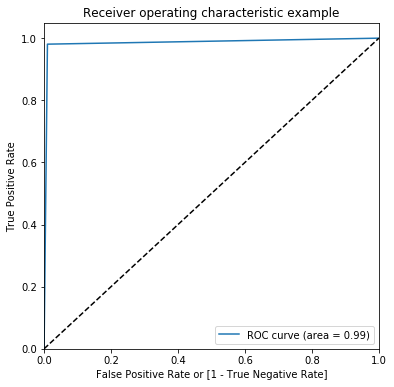

(array([0.        , 0.01004589, 1.        ]),
 array([0.        , 0.98071625, 1.        ]),
 array([2, 1, 0], dtype=int64))

In [137]:
draw_roc(y2_pred_final.churn, y2_pred_final.predicted)

In [138]:
#draw_roc(y_pred_final.Churn, y_pred_final.predicted)
"{:2.2f}".format(metrics.roc_auc_score(y2_pred_final.churn, y2_pred_final.Churn_Prob))

'1.00'

# PCA Unsupervised Model Building with Logistic Regression 

In [139]:
from sklearn.model_selection import train_test_split

# Putting feature variable to X
X3 = telehvoutremove.drop(['churn'],axis=1)

# Putting response variable to y
y3 = telehvoutremove['churn']

In [140]:
# scaling the features
from sklearn.preprocessing import scale

# storing column names in cols, since column names are (annoyingly) lost after 
# scaling (the df is converted to a numpy array)
cols = X3.columns
X3 = pd.DataFrame(scale(X3))
X3.columns = cols
#X2.columns

In [141]:
# split into train and test
from sklearn.model_selection import train_test_split
X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y3, 
                                                    train_size=0.7,
                                                    test_size = 0.3, random_state=100)

In [142]:
# import model and matrics
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, RepeatedStratifiedKFold, StratifiedKFold
from sklearn.metrics import accuracy_score, confusion_matrix,roc_curve, roc_auc_score, precision_score, recall_score, precision_recall_curve
from sklearn.metrics import f1_score

In [143]:
#Checking the Class Imbalance
telehvoutremove['churn'].value_counts()

0    26759
1     2537
Name: churn, dtype: int64

In [144]:
# define class weights
w = {0:8.6, 1:91.4}
# define model
lg2 = LogisticRegression(random_state=100, class_weight=w)



In [145]:
from sklearn.decomposition import PCA

In [146]:


pca_unsupervised = PCA(0.90, random_state=100)

df_train3_pca = pca_unsupervised.fit_transform(X3_train)

# fit it SK Learn Logstic regrssion Model
model_pca = lg2.fit(df_train3_pca,y3_train)
# test
X3_test = pca_unsupervised.fit_transform(X3_test)
y3_pred = model_pca.predict(X3_test)
# performance
print(f'Accuracy Score: {accuracy_score(y3_test,y3_pred)}')
print(f'Confusion Matrix: \n{confusion_matrix(y3_test, y3_pred)}')
print(f'Area Under Curve: {roc_auc_score(y3_test, y3_pred)}')
print(f'Recall score: {recall_score(y3_test,y3_pred)}')

Accuracy Score: 0.7888269427693708
Confusion Matrix: 
[[6418 1645]
 [ 211  515]]
Area Under Curve: 0.752674017866874
Recall score: 0.709366391184573


In [147]:
df_train3_pca.shape

(20507, 34)

In [148]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 6))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return fpr, tpr, thresholds

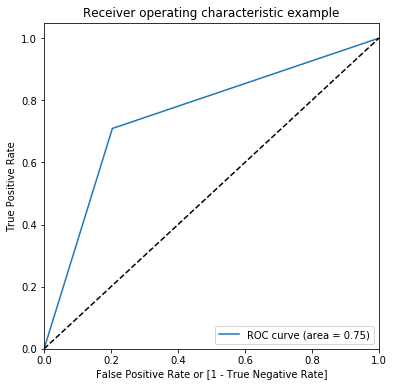

(array([0.        , 0.20401836, 1.        ]),
 array([0.        , 0.70936639, 1.        ]),
 array([2, 1, 0]))

In [149]:
draw_roc(y3_test, y3_pred)

# SVM

In [150]:
from sklearn.model_selection import train_test_split

# Putting feature variable to X
X4 = telehvoutremove.drop(['churn'],axis=1)

# Putting response variable to y
y4 = telehvoutremove['churn']

In [151]:
# scaling the features
from sklearn.preprocessing import scale

# storing column names in cols, since column names are (annoyingly) lost after 
# scaling (the df is converted to a numpy array)
cols = X4.columns
X4 = pd.DataFrame(scale(X4))
X4.columns = cols
#X2.columns

In [152]:
# split into train and test
from sklearn.model_selection import train_test_split
X4_train, X4_test, y4_train, y4_test = train_test_split(X4, y4, 
                                                    train_size=0.7,
                                                    test_size = 0.3, random_state=100)

In [153]:
from sklearn import svm

weights = {0:8.6, 1:91.4}
clf = svm.SVC(kernel='linear', class_weight=weights)

# Initialize SVM classifier
#clf = svm.SVC(kernel='linear')

pca_unsupervised_svm = PCA(0.90, random_state=100)

df_train_svm = pca_unsupervised_svm.fit_transform(X4_train)

# Fit data
clf = clf.fit(df_train_svm, y4_train)

X4_test = pca_unsupervised_svm.fit_transform(X4_test)

# Predict the test set
y4_pred = clf.predict(X4_test)

# performance
print(f'Accuracy Score: {accuracy_score(y4_test,y4_pred)}')
print(f'Confusion Matrix: \n{confusion_matrix(y4_test, y4_pred)}')
print(f'Area Under Curve: {roc_auc_score(y4_test, y4_pred)}')
print(f'Recall score: {recall_score(y4_test,y4_pred)}')

Accuracy Score: 0.8083968597110024
Confusion Matrix: 
[[6600 1463]
 [ 221  505]]
Area Under Curve: 0.757073087316173
Recall score: 0.6955922865013774


In [154]:
#Creating Confusion Matrix
confusion_svm = confusion_matrix(y4_test, y4_pred)

TP1 = confusion_svm[1,1] # true positive 
TN1 = confusion_svm[0,0] # true negatives
FP1 = confusion_svm[0,1] # false positives
FN1 = confusion_svm[1,0] # false negatives

In [155]:
# Let's see the sensitivity of our logistic regression model
TP1 / float(TP1+FN1)

0.6955922865013774

In [156]:
# Let us calculate specificity
TN1 / float(TN1+FP1)

0.8185538881309686

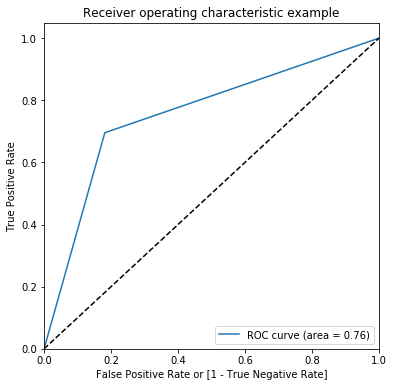

(array([0.        , 0.18144611, 1.        ]),
 array([0.        , 0.69559229, 1.        ]),
 array([2, 1, 0]))

In [157]:
draw_roc(y4_test, y4_pred)

# Final Observations and Conclusion:

We have attempted the Classification through the following methods:

1)Simple Logistic regression by handing class imbalance with follwoing metrics

>a)accuracy = 97.7%
>b)Area under Curve ROC  = 98.7%
>c)Recall or Sensitivity = 100%


2)Partially supervised Incremental PCA tuned with Scree plots and Stats Model Logistic regression with follwoing metrics

>d)accuracy = 98.9%
>e)Area under Curve ROC = 98.5%
>f)Recall or Sensitivity = 98%

3)Unsupervised PCA with SKLearn Logistic Regression handling class imbalance with following Metrics

>g)accuracy = 78.8%
>h)Area under Curve ROC = 75.2%
>i)Recall or Sensitivity = 70.9%

4)SVM Classifier Model handling class Imbalance

>j)accuracy = 80.8%
>k)Area under Curve ROC = 75.7%
>l)Recall or Sensitivity = 69.5%





From Above we can see that our Logistc Regression with partial supervised Incremnetal PCA model is providing overall better results in all metrics. Simple Logistc Regression has the Highest Recall or Sensitivity of 100% while also identifying the main features responsible for Customer Churn.

The Most Important Features which are predicting Customer Churn are as Following

>std_ic_t2m_mou_good

>std_ic_mou_good

>std_ic_t2m_mou_8

>total_usage

>loc_ic_t2m_mou_8

>offnet_mou_8

>onnet_mou_8

>loc_ic_t2t_mou_8

>loc_ic_t2f_mou_8

>roam_og_mou_8

>isd_ic_mou_8


#### We could provide recommendations to the Company that providing Special Packs for STD, Roaming and ISD Might help in reducing Customer Churn